# Housing Price Prediction:

# Problem Statement:

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

Which variables are important to predict the price of variable?
How do these variables describe the price of the house?

# Business Goal:

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

# Technical Requirements:

Data contains 1460 entries each having 81 variables.
Data contains Null values. You need to treat them using the domain knowledge and your own understanding.
Extensive EDA has to be performed to gain relationships of important variable and price.
Data contains numerical as well as categorical variable. You need to handle them accordingly.
You have to build Machine Learning models, apply regularization and determine the optimal values of Hyper Parameters.
You need to find important features which affect the price positively or negatively.
Two datasets are being provided to you (test.csv, train.csv). You will train on train.csv dataset and predict on test.csv file.

# Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


In [2]:
df_train = pd.read_csv("C:/train.csv")
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [3]:
df_test = pd.read_csv("C:/test.csv")
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [4]:
print("Shape of train dataset is:",df_train.shape)
print("Shape of test dataset is:",df_test.shape)

Shape of train dataset is: (1168, 81)
Shape of test dataset is: (292, 80)


In [5]:
print("Columns present in train dataset:\n",df_train.columns)
print("\n")
print("Columns present in test dataset:\n",df_test.columns)

Columns present in train dataset:
 Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual

In [6]:
df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

In [7]:
df_test.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MiscVal            int64
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
Length: 80, dtype: object

In [8]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In [9]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

# Feature Engineering

In [10]:
df_test.nunique().to_frame("No of Unique Values")

,No of Unique Values
Id,292
MSSubClass,15
MSZoning,4
LotFrontage,65
LotArea,249
...,...
MiscVal,8
MoSold,12
YrSold,5
SaleType,6


In [11]:
df_train.drop("Id",axis=1,inplace=True)
df_train.drop("Utilities",axis=1,inplace=True)

In [12]:
df_test.nunique().to_frame("No of Unique Values")

,No of Unique Values
Id,292
MSSubClass,15
MSZoning,4
LotFrontage,65
LotArea,249
...,...
MiscVal,8
MoSold,12
YrSold,5
SaleType,6


In [13]:
df_test.drop("Id",axis=1,inplace=True)
df_test.drop("Utilities",axis=1,inplace=True)

In [14]:
for i in df_train.columns:
        print(df_train[i].value_counts())
        print('*'*100)

20     428
60     244
50     113
120     69
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64
****************************************************************************************************
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
****************************************************************************************************
60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
        ... 
102.0      1
144.0      1
112.0      1
149.0      1
153.0      1
Name: LotFrontage, Length: 106, dtype: int64
****************************************************************************************************
9600     21
7200     18
6000     16
8400     14
9000     11
         ..
12803     1
9480      1
13478     1
12122     1
7861      1
Name: LotArea, Length: 892, dtype: int64
************************************

# Dealing with zero values

In [15]:
Zero_value = pd.DataFrame(df_train.isin([0]).sum().sort_values(ascending=False))
Zero_value.columns=['Count of Zero values']
Zero_value['% of Zero values']=Zero_value['Count of Zero values']/11.68     # 1168/100 = 11.68
Zero_value

,Count of Zero values,% of Zero values
PoolArea,1161,99.400685
3SsnPorch,1146,98.116438
LowQualFinSF,1145,98.030822
MiscVal,1126,96.404110
BsmtHalfBath,1105,94.606164
...,...,...
ExterQual,0,0.000000
MasVnrType,0,0.000000
Exterior2nd,0,0.000000
Exterior1st,0,0.000000


In [16]:
for i in df_test.columns:
        print(df_test[i].value_counts())
        print('*'*100)

20     108
60      55
50      31
120     18
30      17
160     16
80      15
90      11
70       7
180      4
190      4
45       2
75       2
85       1
40       1
Name: MSSubClass, dtype: int64
****************************************************************************************************
RL         223
RM          55
FV          13
C (all)      1
Name: MSZoning, dtype: int64
****************************************************************************************************
60.0    32
85.0    14
50.0    13
70.0    12
21.0     9
        ..
77.0     1
71.0     1
59.0     1
36.0     1
69.0     1
Name: LotFrontage, Length: 65, dtype: int64
****************************************************************************************************
7200     7
1680     4
5400     3
8450     3
9600     3
        ..
8280     1
9735     1
6979     1
12822    1
1953     1
Name: LotArea, Length: 249, dtype: int64
*************************************************************************************

In [17]:
zero_value = pd.DataFrame(df_test.isin([0]).sum().sort_values(ascending=False))
zero_value.columns=['Count of Zero values']
zero_value['% of Zero values']=zero_value['Count of Zero values']/2.92     # 292/100 = 2.92
zero_value

,Count of Zero values,% of Zero values
PoolArea,292,100.000000
3SsnPorch,290,99.315068
LowQualFinSF,289,98.972603
MiscVal,282,96.575342
BsmtHalfBath,273,93.493151
...,...,...
ExterQual,0,0.000000
MasVnrType,0,0.000000
Exterior2nd,0,0.000000
Exterior1st,0,0.000000


# Checking null values in train dataset

In [18]:
train_null = pd.DataFrame(df_train[df_train.columns[df_train.isnull().any()]].isnull().sum())
train_null.columns=['Count of Null Values']
train_null['% of Null Values']=train_null['Count of Null Values']/11.68     # 1168/100 = 11.68
train_null

,Count of Null Values,% of Null Values
LotFrontage,214,18.321918
Alley,1091,93.407534
MasVnrType,7,0.599315
MasVnrArea,7,0.599315
BsmtQual,30,2.568493
BsmtCond,30,2.568493
BsmtExposure,31,2.654110
BsmtFinType1,30,2.568493
BsmtFinType2,31,2.654110
FireplaceQu,551,47.174658


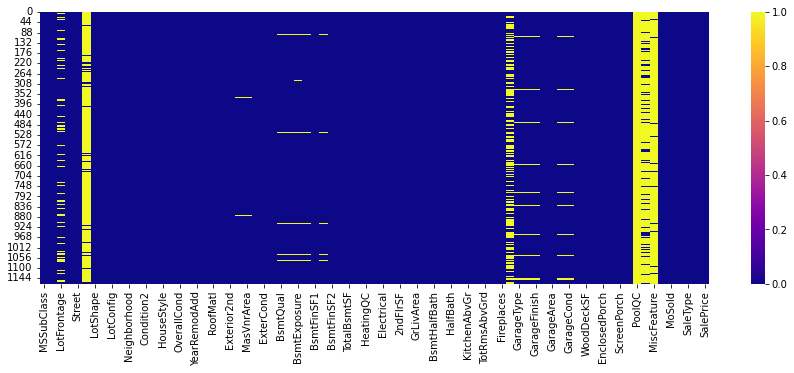

In [19]:
plt.figure(figsize=(15,5))
sns.heatmap(df_train.isnull(), cmap="plasma")
plt.show()

In [20]:
df_train.drop(["PoolQC", "MiscFeature", "Alley", "Fence"],axis=1,inplace=True)

# Treating null values using imputation techniques

In [21]:
col1=df_train.columns.values
for i in range(0,len(col1)):
    if df_train[col1[i]].dtype == "object":
        df_train[col1[i]].fillna(df_train[col1[i]].mode()[0], inplace=True)

In [22]:
col2=df_train.columns.values
for i in range(0,len(col2)):
    if df_train[col2[i]].dtype != "object":
        df_train[col2[i]].fillna(df_train[col2[i]].mean(), inplace=True)

In [23]:
df_train.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 75, dtype: int64

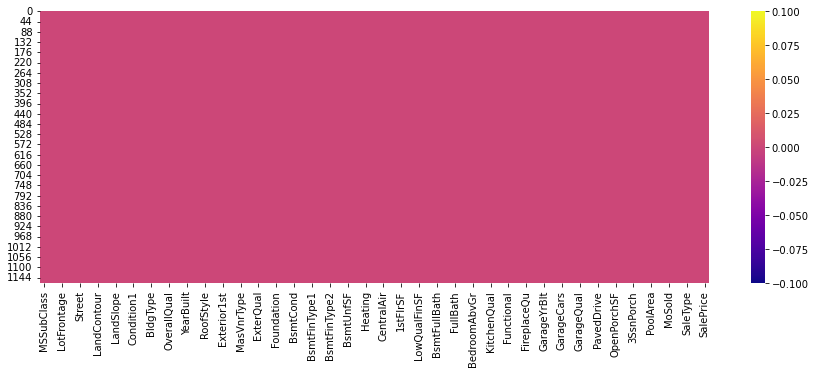

In [24]:
plt.figure(figsize=(15,5))
sns.heatmap(df_train.isnull(), cmap="plasma")
plt.show()

# Checking null values in test dataset

In [25]:
test_null = pd.DataFrame(df_test[df_test.columns[df_test.isnull().any()]].isnull().sum())
test_null.columns=['Count of Null Values']
test_null['% of Null Values']=test_null['Count of Null Values']/2.92     # 292/100 = 11.68
test_null

,Count of Null Values,% of Null Values
LotFrontage,45,15.410959
Alley,278,95.205479
MasVnrType,1,0.342466
MasVnrArea,1,0.342466
BsmtQual,7,2.397260
BsmtCond,7,2.397260
BsmtExposure,7,2.397260
BsmtFinType1,7,2.397260
BsmtFinType2,7,2.397260
Electrical,1,0.342466


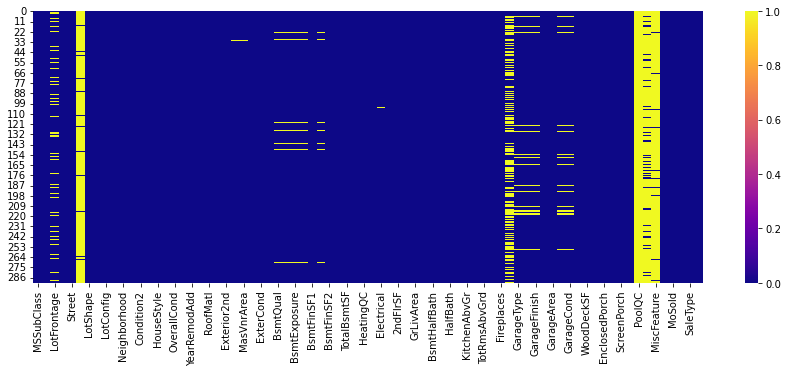

In [26]:
plt.figure(figsize=(15,5))
sns.heatmap(df_test.isnull(), cmap="plasma")
plt.show()

In [27]:
df_test.drop(["PoolQC", "MiscFeature", "Alley", "Fence"],axis=1,inplace=True)

In [28]:
cols1=df_test.columns.values
for i in range(0,len(cols1)):
    if df_test[cols1[i]].dtype == "object":
        df_test[cols1[i]].fillna(df_test[cols1[i]].mode()[0], inplace=True)

In [29]:
cols2=df_test.columns.values
for i in range(0,len(cols2)):
    if df_test[cols2[i]].dtype != "object":
        df_test[cols2[i]].fillna(df_test[cols2[i]].mean(), inplace=True)

In [30]:
df_test.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
                ..
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
Length: 74, dtype: int64

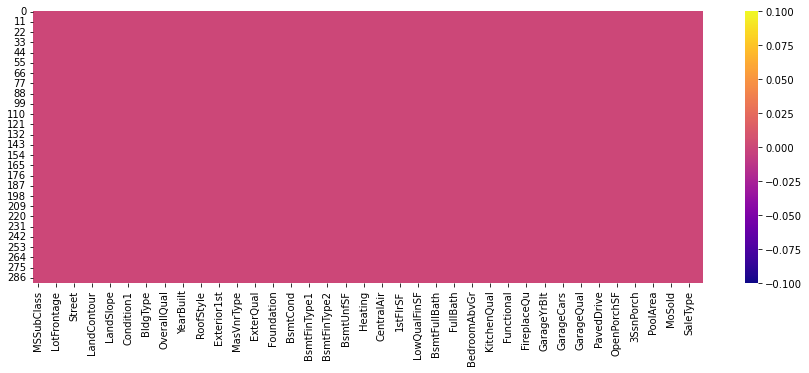

In [31]:
plt.figure(figsize=(15,5))
sns.heatmap(df_test.isnull(), cmap="plasma")
plt.show()

In [32]:
df_train["SalePrice"].unique()

array([128000, 268000, 269790, 190000, 215000, 219210, 121500, 155000,
       140000, 118500, 119500, 237000, 201000, 126500, 135500, 165000,
       120500, 194500, 148000, 106000, 231500, 133000, 142125, 136500,
       146000, 217000, 112000, 394432, 113000, 188700, 319900, 135000,
       128500, 169000, 122000, 152000, 243000, 156000,  79500, 132000,
       144152, 130000, 149900, 124500, 179000, 147000,  39300, 312500,
       256000,  60000, 153000,  84900, 230000, 180000, 106500, 239000,
       107500, 123000, 176000, 228500, 117500, 350000, 200624, 173000,
       225000,  84500, 174900,  79000, 297000,  87000, 465000, 204900,
       127000, 159000, 170000, 159500, 102000, 109500, 163990, 189950,
       119000, 157500, 287000, 144000, 286000, 172000, 212000, 124000,
       150000, 205950, 251000, 129000, 223500, 475000, 335000, 115000,
       205000, 209500, 176432, 171000, 302000, 259500, 141000, 187500,
       385000, 275000, 108000,  89500, 109900, 185000, 143000, 127500,
      

In [33]:
print("Shape of train dataset is:",df_train.shape)
print("Shape of test dataset is:",df_test.shape)

Shape of train dataset is: (1168, 75)
Shape of test dataset is: (292, 74)


# Separating numerical and categorical columns.

In [34]:
categorical_coltr=[]
for i in df_train.dtypes.index:
    if df_train.dtypes[i]=='object':
        categorical_coltr.append(i)
print("Categorical columns in train dataset are:\n",categorical_coltr)
print("\n")

numerical_coltr=[]
for i in df_train.dtypes.index:
    if df_train.dtypes[i]!='object':
        numerical_coltr.append(i)
print("Numerical columns in train dataset are:\n",numerical_coltr)

Categorical columns in train dataset are:
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


Numerical columns in train dataset are:
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodD

In [35]:
categorical_colte=[]
for i in df_test.dtypes.index:
    if df_test.dtypes[i]=='object':
        categorical_colte.append(i)
print("Categorical columns in test dataset are:\n",categorical_colte)
print("\n")

# Now checking for numerical columns
numerical_colte=[]
for i in df_test.dtypes.index:
    if df_test.dtypes[i]!='object':
        numerical_colte.append(i)
print("Numerical columns in test dataset are:\n",numerical_colte)

Categorical columns in test dataset are:
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


Numerical columns in test dataset are:
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDec

# Description of Train Dataset

In [36]:
df_train.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,...,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,46.647260,...,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,41.940650,22.437056,8957.442311,1.390153,1.124343,30.145255,20.785185,182.047152,462.664785,163.520016,...,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,...,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


# Description of Test Dataset

In [37]:
df_test.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,...,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.0,292.000000,292.000000,292.000000
mean,57.414384,66.425101,10645.143836,6.078767,5.493151,1972.616438,1985.294521,109.171821,439.294521,46.157534,...,457.458904,86.397260,47.061644,17.708904,2.489726,15.099315,0.0,28.184932,6.232877,2007.859589
std,43.780649,19.975962,13330.669795,1.356147,1.063267,30.447016,20.105792,174.729023,429.559675,152.467119,...,210.785591,121.898836,65.865449,51.892906,30.247488,58.483473,0.0,224.036218,2.774556,1.322867
min,20.000000,21.000000,1526.000000,3.000000,3.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,2006.000000
25%,20.000000,57.750000,7200.000000,5.000000,5.000000,1954.000000,1968.000000,0.000000,0.000000,0.000000,...,300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,4.000000,2007.000000
50%,50.000000,66.425101,9200.000000,6.000000,5.000000,1976.000000,1994.000000,0.000000,369.500000,0.000000,...,467.500000,0.000000,28.500000,0.000000,0.000000,0.000000,0.0,0.000000,6.000000,2008.000000
75%,70.000000,76.000000,11658.750000,7.000000,6.000000,2001.000000,2003.250000,180.000000,700.500000,0.000000,...,569.750000,149.250000,66.000000,0.000000,0.000000,0.000000,0.0,0.000000,8.000000,2009.000000
max,190.000000,150.000000,215245.000000,10.000000,9.000000,2009.000000,2010.000000,1031.000000,1767.000000,1085.000000,...,1052.000000,728.000000,418.000000,330.000000,407.000000,396.000000,0.0,3500.000000,12.000000,2010.000000


# Data Visualization
Univariate Analysis
Plotting categorical columns

Pie plot for the column: Street
Pave    1164
Grvl       4
Name: Street, dtype: int64


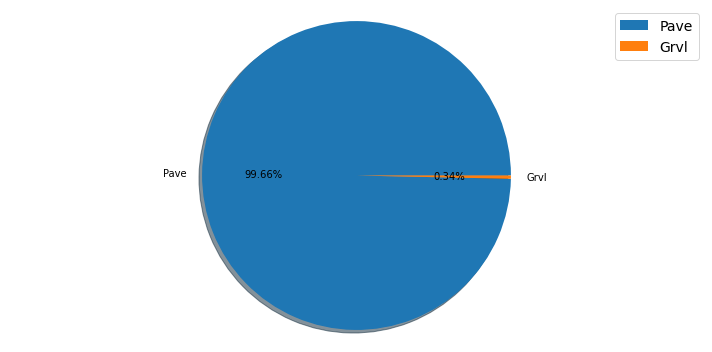

*****************************************************************************************************************************
Pie plot for the column: LotShape
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


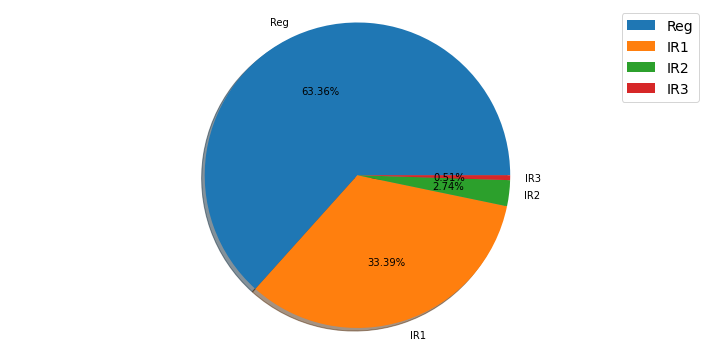

*****************************************************************************************************************************
Pie plot for the column: LandContour
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


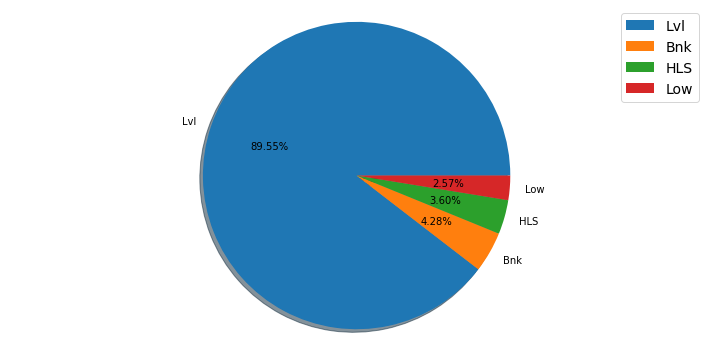

*****************************************************************************************************************************
Pie plot for the column: LandSlope
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


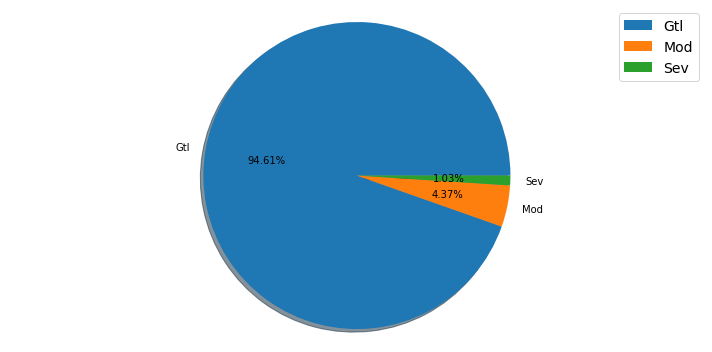

*****************************************************************************************************************************
Pie plot for the column: MasVnrType
None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


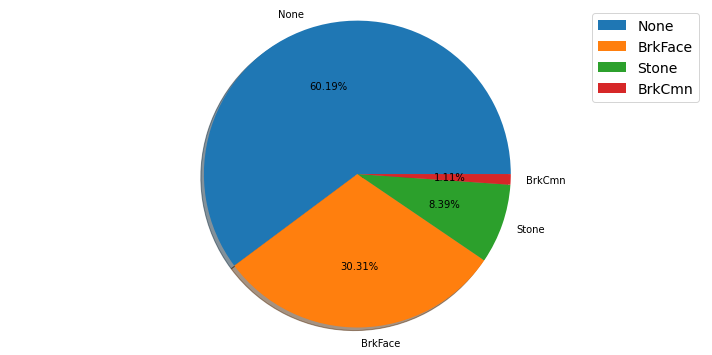

*****************************************************************************************************************************
Pie plot for the column: ExterQual
TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


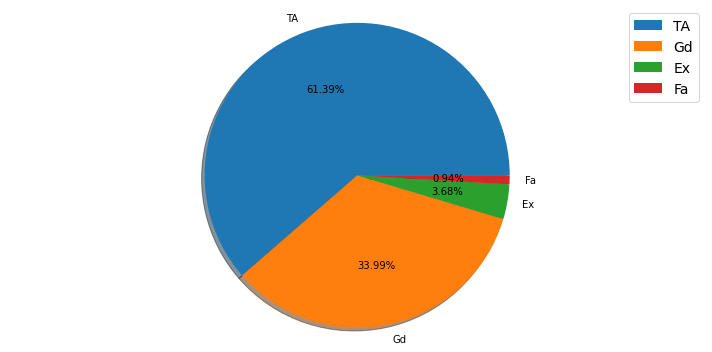

*****************************************************************************************************************************
Pie plot for the column: BsmtQual
TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64


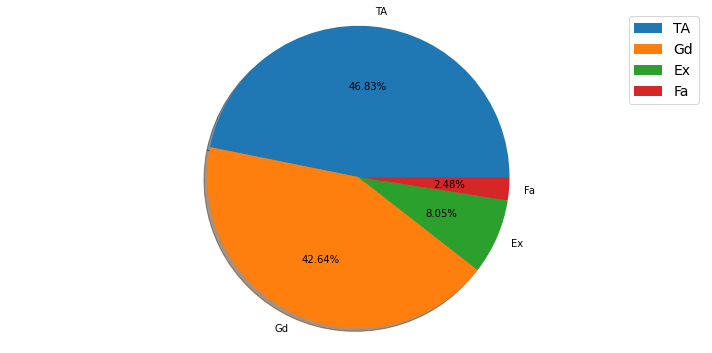

*****************************************************************************************************************************
Pie plot for the column: BsmtCond
TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64


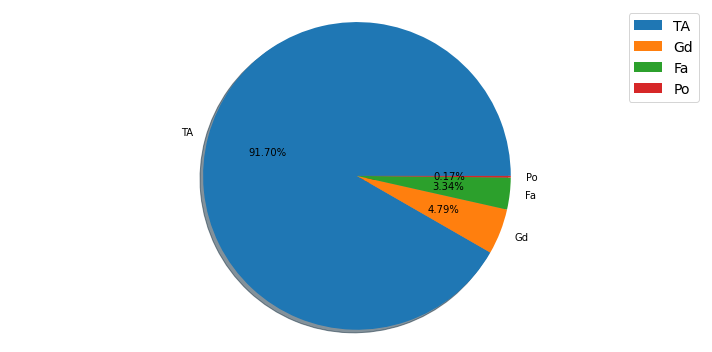

*****************************************************************************************************************************
Pie plot for the column: BsmtExposure
No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64


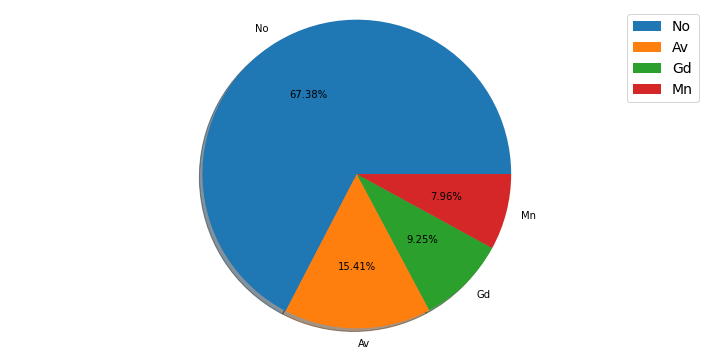

*****************************************************************************************************************************
Pie plot for the column: CentralAir
Y    1090
N      78
Name: CentralAir, dtype: int64


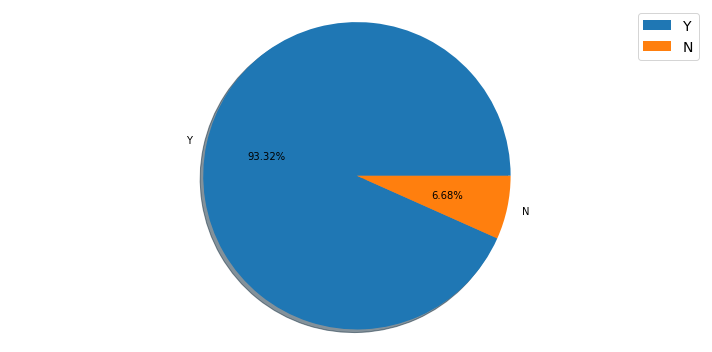

*****************************************************************************************************************************
Pie plot for the column: KitchenQual
TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


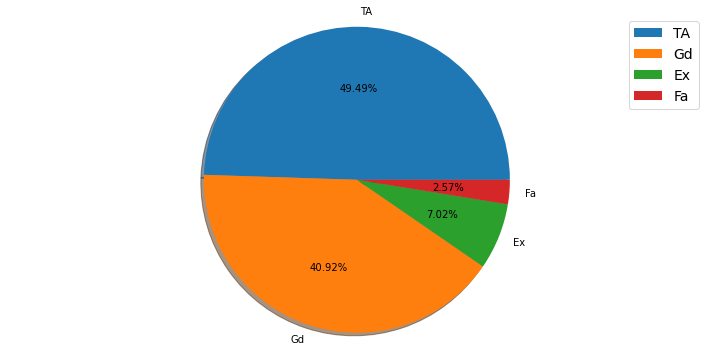

*****************************************************************************************************************************
Pie plot for the column: GarageFinish
Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64


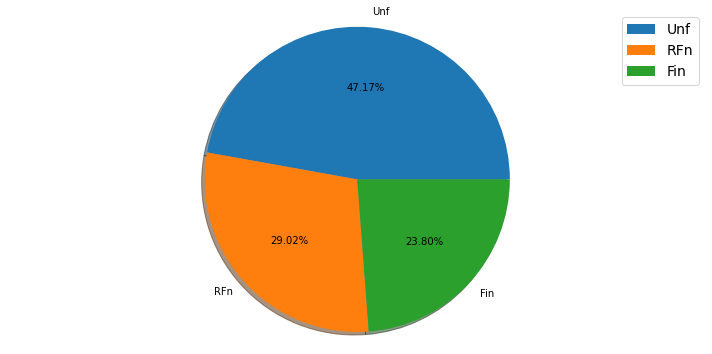

*****************************************************************************************************************************
Pie plot for the column: PavedDrive
Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


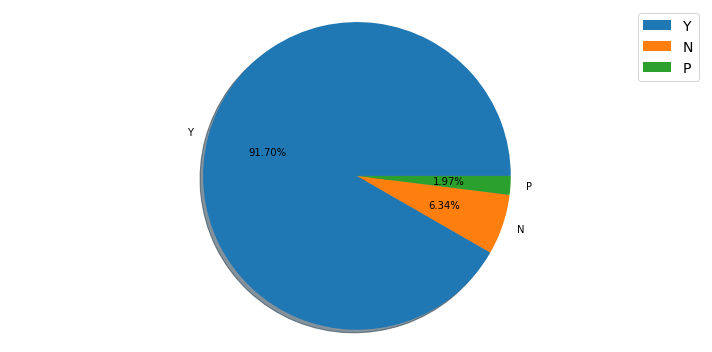

*****************************************************************************************************************************


In [38]:
def generate_pie(i):
    plt.figure(figsize=(10,5))
    plt.pie(i.value_counts(), labels=i.value_counts().index, autopct='%1.2f%%',shadow=True,)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

cols1 = ['Street', 'LotShape','LandContour','LandSlope', 'MasVnrType','ExterQual','BsmtQual','BsmtCond','BsmtExposure','CentralAir','KitchenQual','GarageFinish','PavedDrive']

plotnumber=1
for j in df_train[cols1]:
    print(f"Pie plot for the column:", j)
    print(df_train[j].value_counts())
    generate_pie(df_train[j])
    print("*"*125)

In [39]:
def value_count(column):
    counts=len(df_train[column].value_counts())
    if counts<3:
        plt.figure(figsize=(10,5))
    elif counts<5:
        plt.figure(figsize=(10,5))
        plt.xticks(rotation=90)
    elif counts<10:
        plt.figure(figsize=(10,5))
        plt.xticks(rotation=90)
    else:
        plt.figure(figsize=(10,5))
        plt.xticks(rotation=90)
    sns.countplot(x=column,data=df_train,palette="hsv")
    plt.show()
    print("*"*125)

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


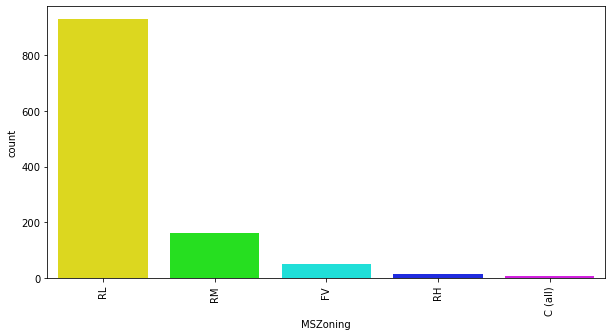

*****************************************************************************************************************************
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


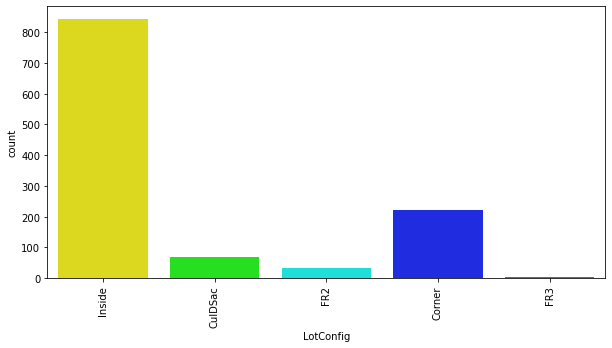

*****************************************************************************************************************************
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


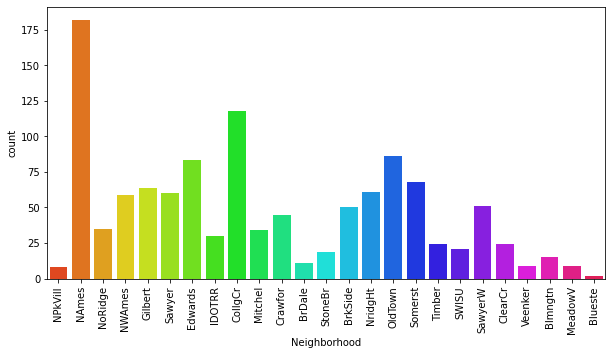

*****************************************************************************************************************************
Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


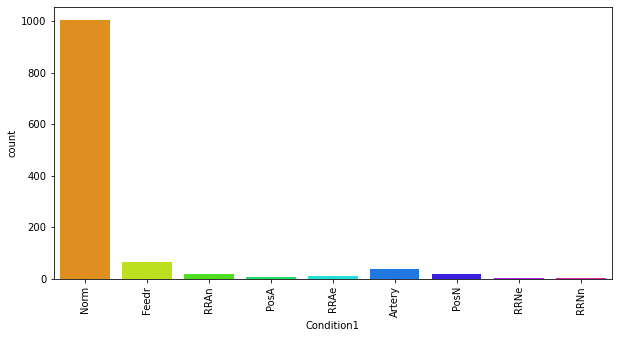

*****************************************************************************************************************************
Norm      1154
Feedr        6
PosN         2
Artery       2
RRAe         1
RRNn         1
PosA         1
RRAn         1
Name: Condition2, dtype: int64


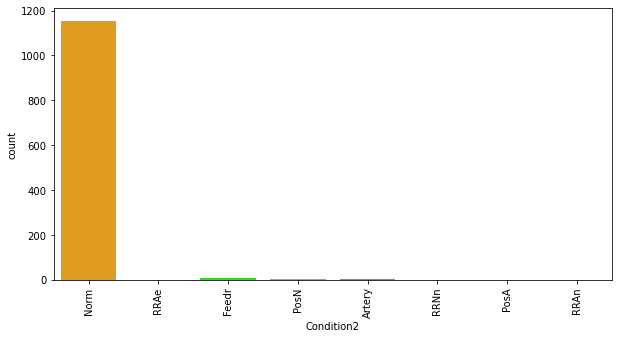

*****************************************************************************************************************************
1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


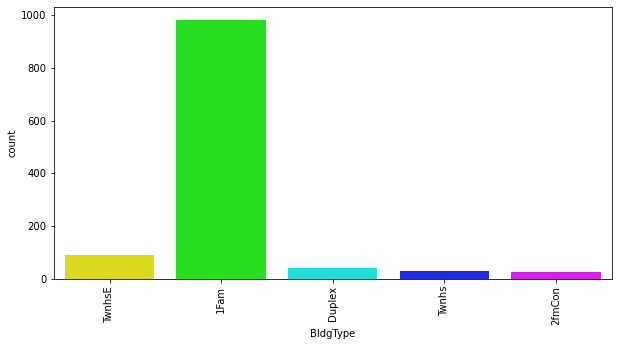

*****************************************************************************************************************************
1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


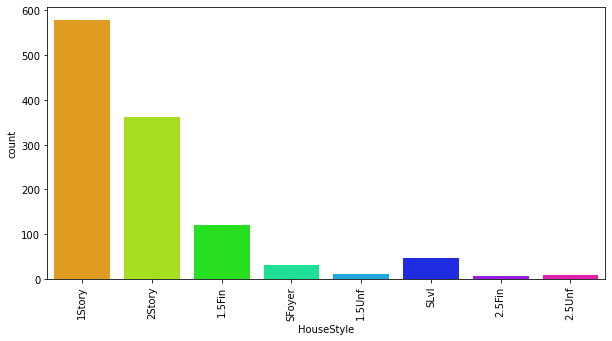

*****************************************************************************************************************************
Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


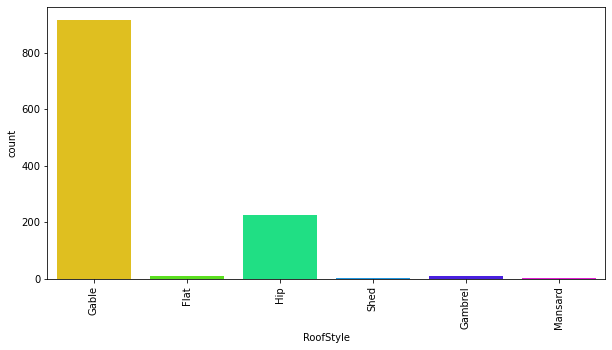

*****************************************************************************************************************************
CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
ClyTile       1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64


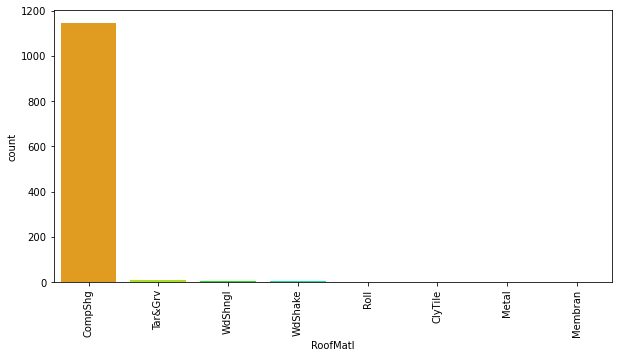

*****************************************************************************************************************************
VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
ImStucc      1
BrkComm      1
Name: Exterior1st, dtype: int64


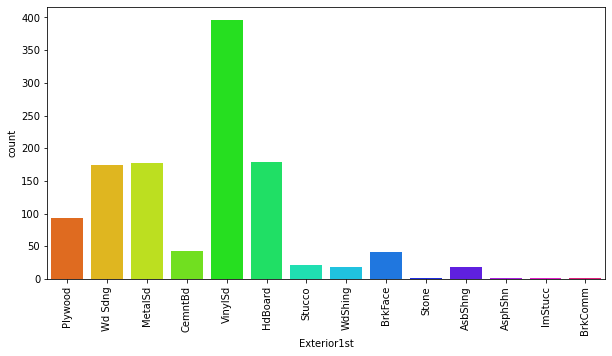

*****************************************************************************************************************************
VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


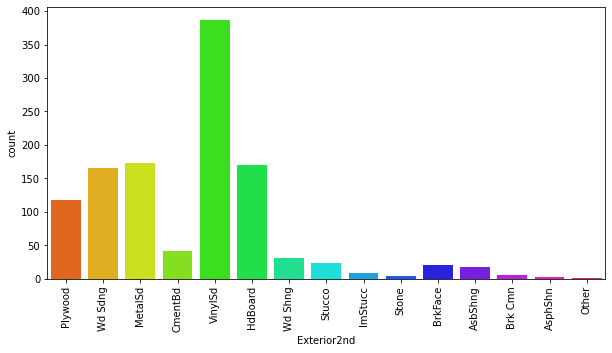

*****************************************************************************************************************************
TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


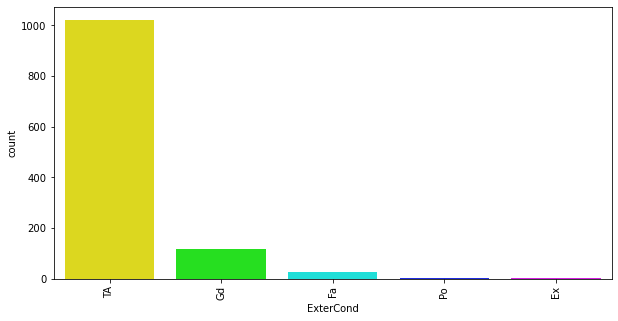

*****************************************************************************************************************************
CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


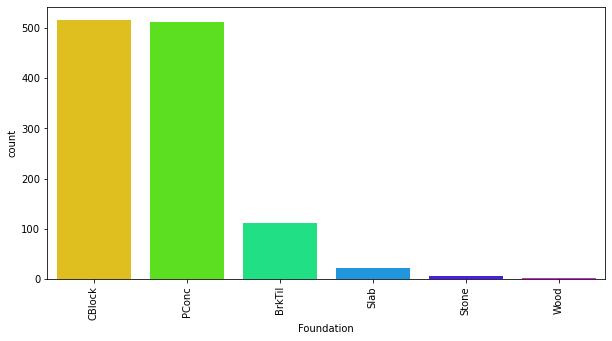

*****************************************************************************************************************************
Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


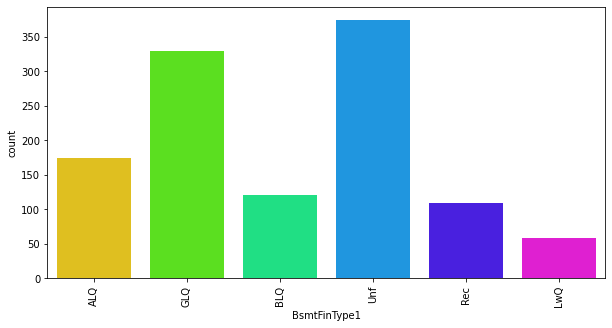

*****************************************************************************************************************************
Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


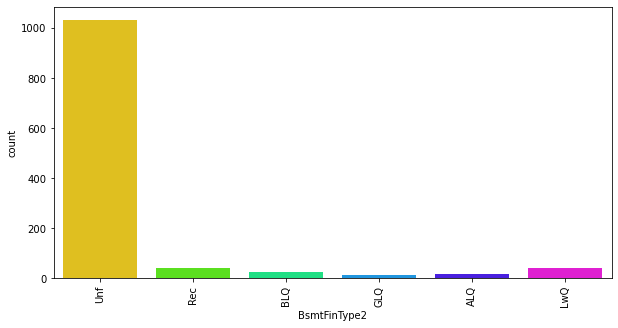

*****************************************************************************************************************************
GasA     1143
GasW       14
Grav        5
Wall        4
Floor       1
OthW        1
Name: Heating, dtype: int64


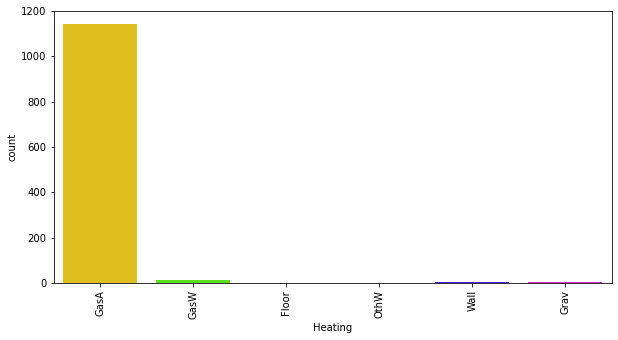

*****************************************************************************************************************************
Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


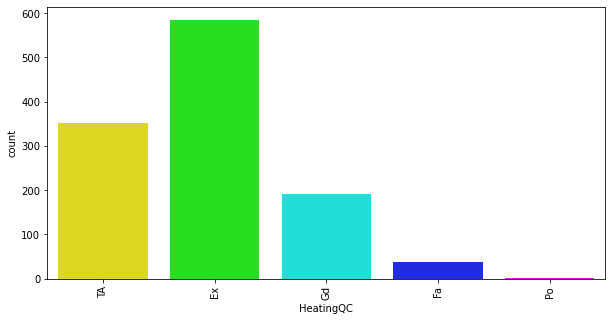

*****************************************************************************************************************************
SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


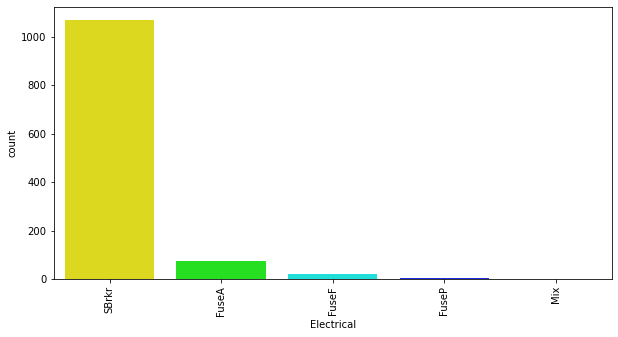

*****************************************************************************************************************************
Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


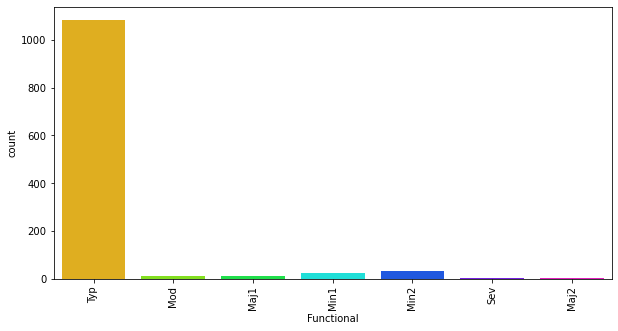

*****************************************************************************************************************************
Gd    852
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64


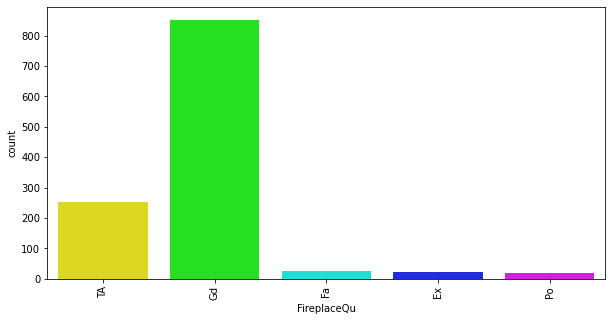

*****************************************************************************************************************************
Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


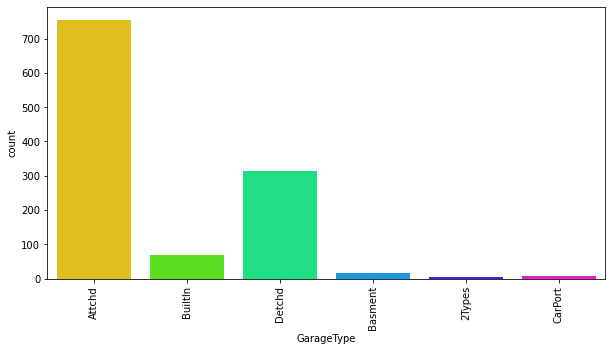

*****************************************************************************************************************************
TA    1114
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64


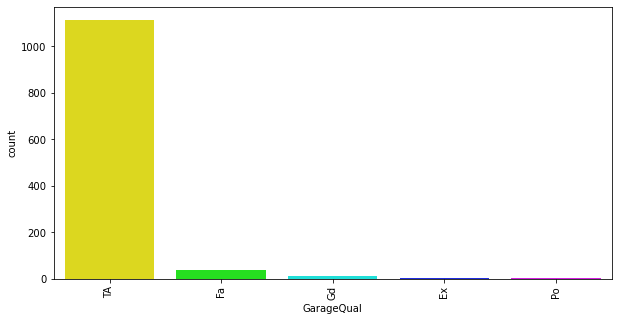

*****************************************************************************************************************************
TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


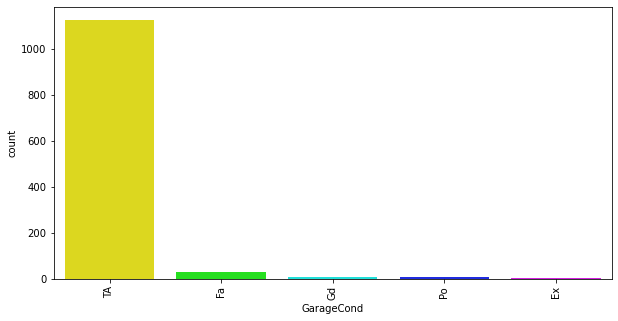

*****************************************************************************************************************************
WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
Oth        3
CWD        3
Con        2
Name: SaleType, dtype: int64


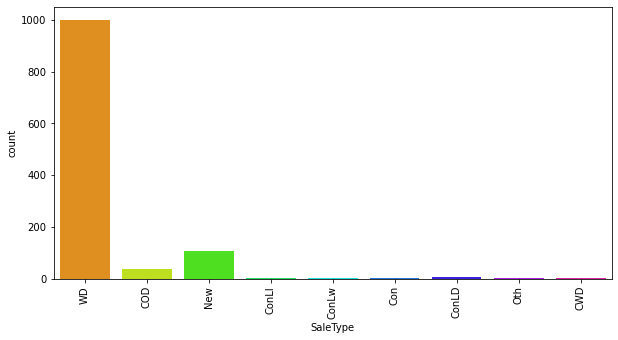

*****************************************************************************************************************************
Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


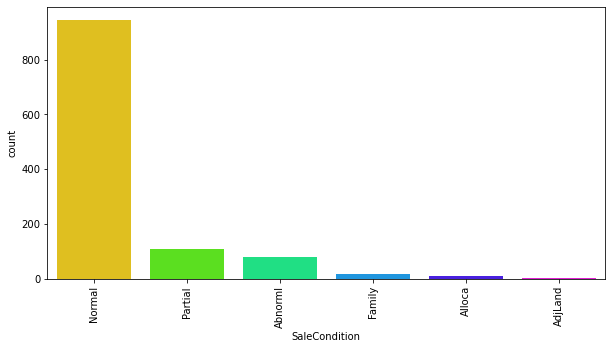

*****************************************************************************************************************************


In [40]:
df1 = df_train[['MSZoning','LotConfig',  'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',  'ExterCond', 'Foundation','BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',  'Electrical',  'Functional', 'FireplaceQu', 'GarageType',  'GarageQual', 'GarageCond', 'SaleType', 'SaleCondition']]
for i in df1:
    print(df1[i].value_counts())
    value_count(i)

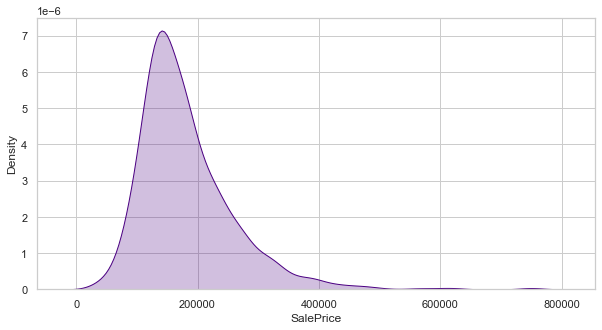

In [41]:
sns.set(style="whitegrid")

plt.figure(figsize=(10,5))
sns.distplot(df_train["SalePrice"],color="indigo",kde_kws={"shade": True},hist=False)
plt.show()

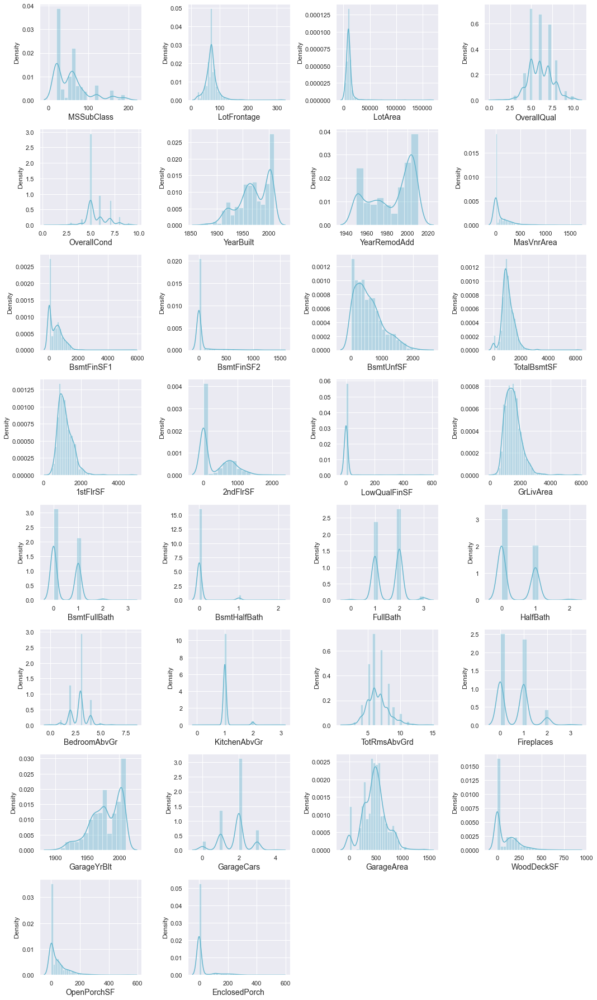

In [42]:
sns.set(style="darkgrid")

plt.figure(figsize=(15,25),facecolor='white')
plotnumber=1
for column in numerical_coltr:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(df_train[column],color="c")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

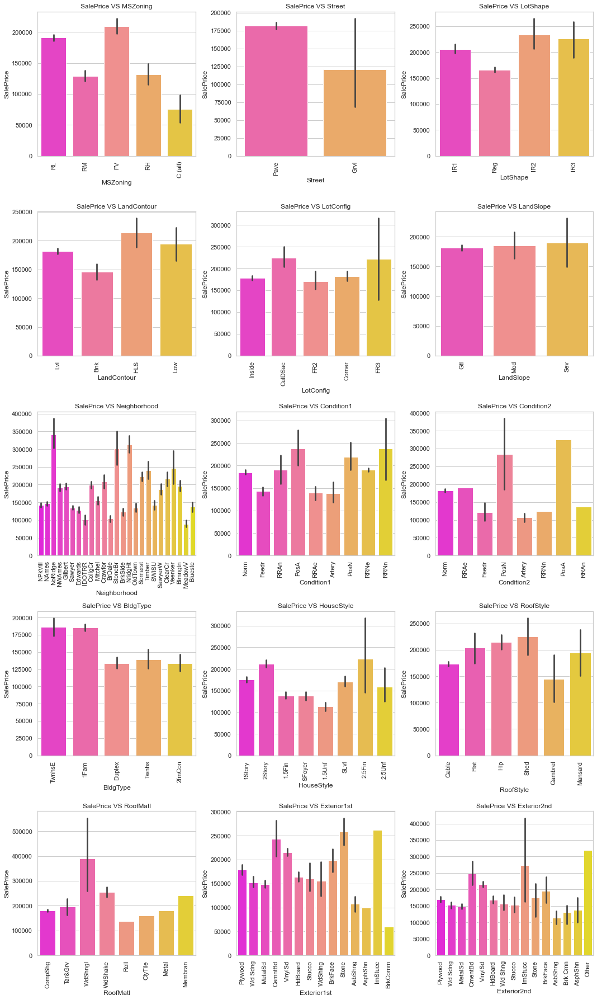

In [43]:
nominal_data1 = ['MSZoning','Street','LotShape','LandContour','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd']
sns.set(style="whitegrid")

plt.figure(figsize=(15,25))
for i in range(len(nominal_data1)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=df_train['SalePrice'],x=df_train[nominal_data1[i]],palette="spring")
    plt.title(f"SalePrice VS {nominal_data1[i]}",fontsize=12)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

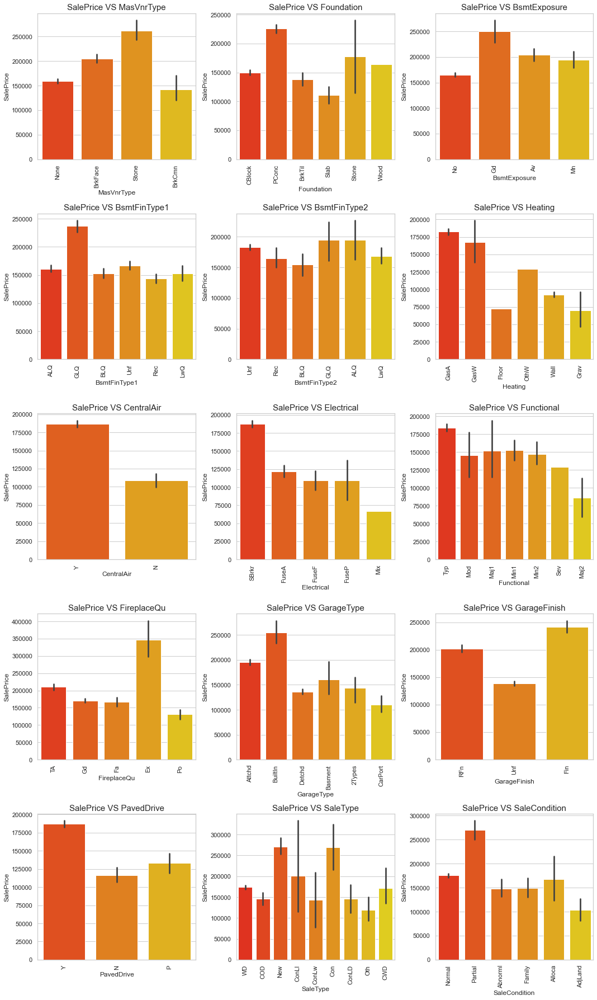

In [44]:
nominal_data2 = ['MasVnrType','Foundation','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','CentralAir','Electrical','Functional','FireplaceQu','GarageType','GarageFinish','PavedDrive','SaleType','SaleCondition']
plt.figure(figsize=(15,25))
for i in range(len(nominal_data2)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=df_train['SalePrice'],x=df_train[nominal_data2[i]],palette="autumn")
    plt.title(f"SalePrice VS {nominal_data2[i]}",fontsize=15)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

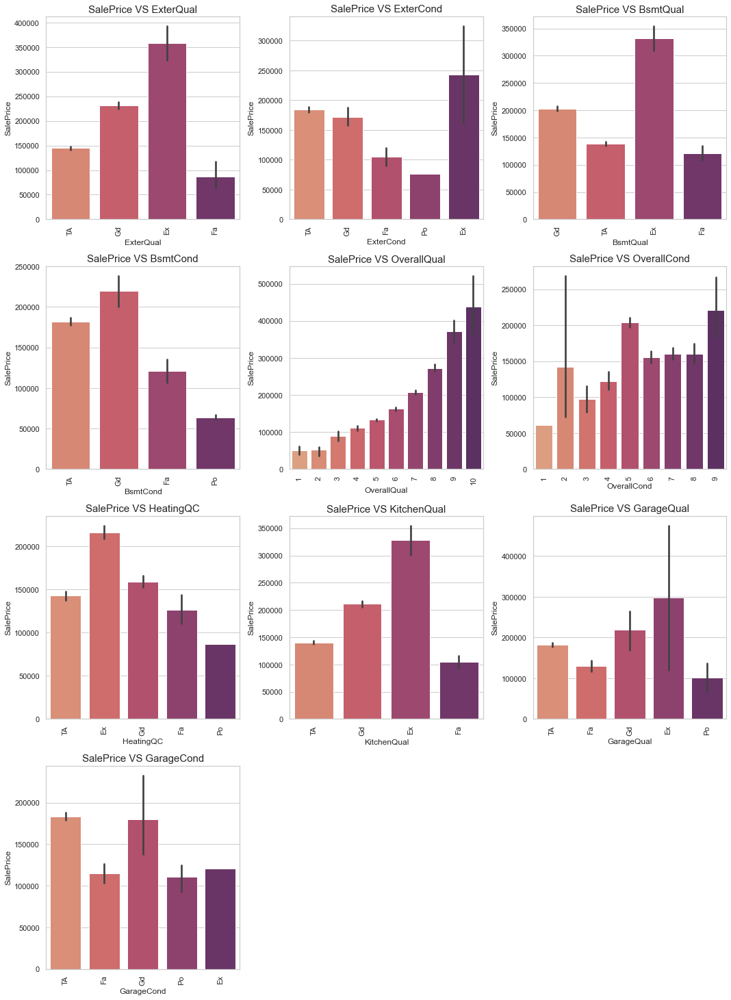

In [45]:
ordinal_data = ['ExterQual','ExterCond','BsmtQual','BsmtCond','OverallQual','OverallCond','HeatingQC','KitchenQual','GarageQual','GarageCond']
plt.figure(figsize=(15,25))
for i in range(len(ordinal_data)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=df_train['SalePrice'],x=df_train[ordinal_data[i]],palette="flare")
    plt.title(f"SalePrice VS {ordinal_data[i]}",fontsize=15)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

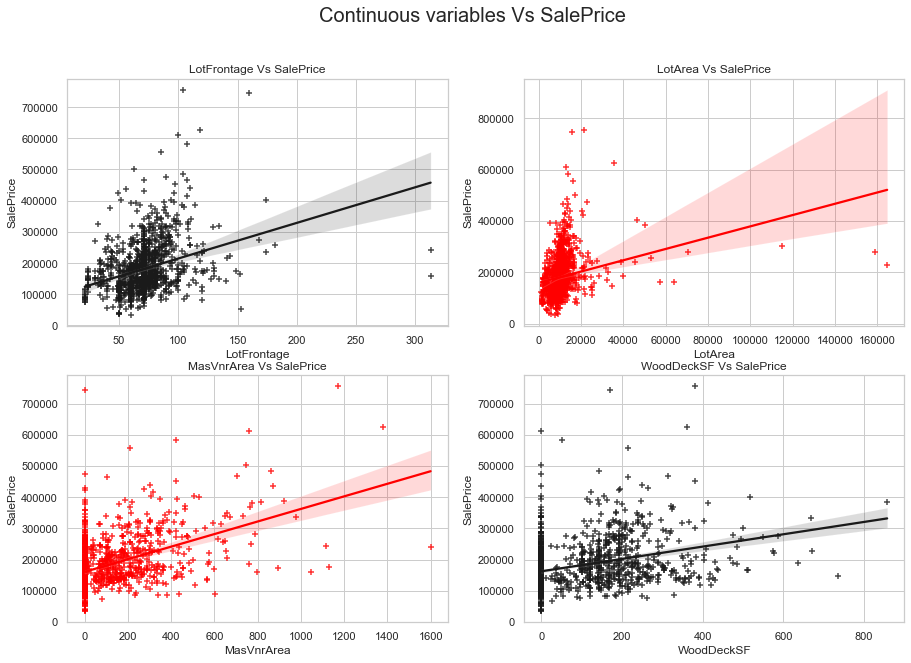

In [46]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('LotFrontage Vs SalePrice')
sns.regplot(x='LotFrontage',y='SalePrice',data=df_train,marker="+",color='k')

plt.subplot(2,2,2)
plt.title('LotArea Vs SalePrice')
sns.regplot(x='LotArea',y='SalePrice',data=df_train,marker="+",color='red')

plt.subplot(2,2,3)
plt.title('MasVnrArea Vs SalePrice')
sns.regplot(x='MasVnrArea',y='SalePrice',data=df_train,marker="+",color='red')

plt.subplot(2,2,4)
plt.title('WoodDeckSF Vs SalePrice')
sns.regplot(x='WoodDeckSF',y='SalePrice',data=df_train,marker="+",color="k")
plt.show()

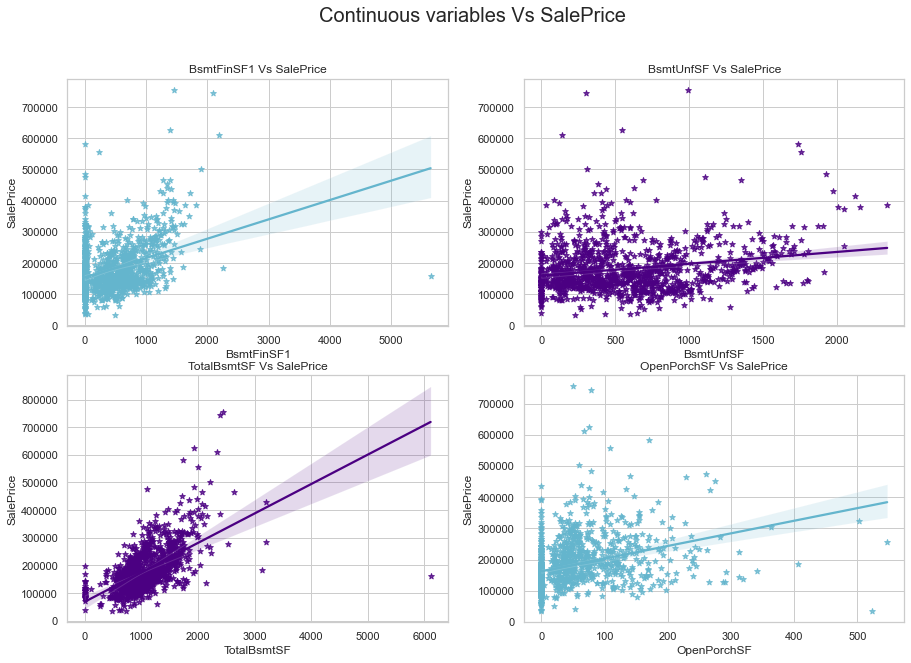

In [47]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('BsmtFinSF1 Vs SalePrice')
sns.regplot(x='BsmtFinSF1',y='SalePrice',data=df_train,marker="*",color='c')

plt.subplot(2,2,2)
plt.title('BsmtUnfSF Vs SalePrice')
sns.regplot(x='BsmtUnfSF',y='SalePrice',data=df_train,marker="*",color='indigo')

plt.subplot(2,2,3)
plt.title('TotalBsmtSF Vs SalePrice')
sns.regplot(x='TotalBsmtSF',y='SalePrice',data=df_train,marker="*",color='indigo')

plt.subplot(2,2,4)
plt.title('OpenPorchSF Vs SalePrice')
sns.regplot(x='OpenPorchSF',y='SalePrice',data=df_train,marker="*",color="c")
plt.show()

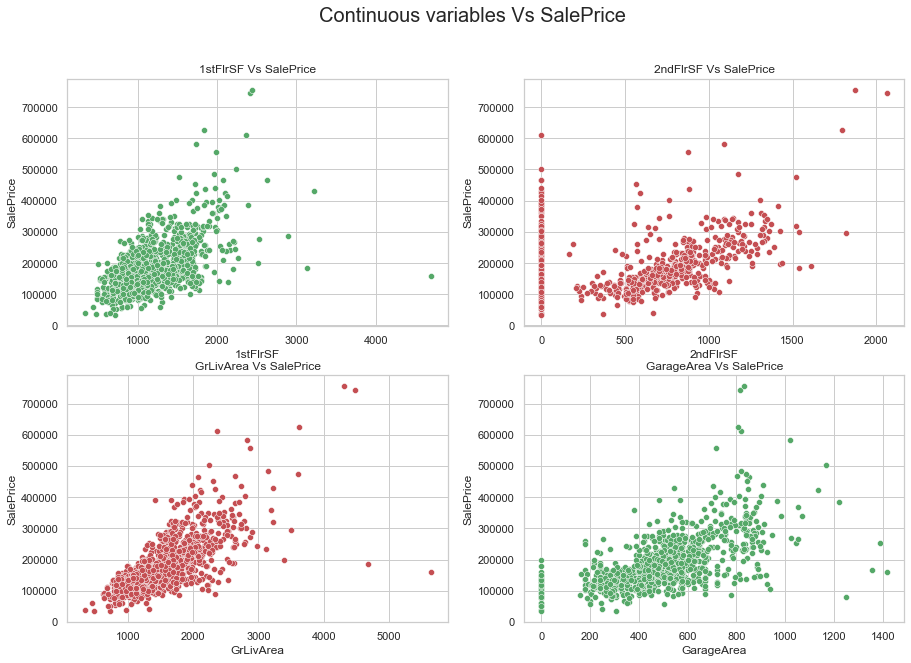

In [48]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('1stFlrSF Vs SalePrice')
sns.scatterplot(x='1stFlrSF',y='SalePrice',data=df_train,color='g')

plt.subplot(2,2,2)
plt.title('2ndFlrSF Vs SalePrice')
sns.scatterplot(x='2ndFlrSF',y='SalePrice',data=df_train,color='r')

plt.subplot(2,2,3)
plt.title('GrLivArea Vs SalePrice')
sns.scatterplot(x='GrLivArea',y='SalePrice',data=df_train,color='r')

plt.subplot(2,2,4)
plt.title('GarageArea Vs SalePrice')
sns.scatterplot(x='GarageArea',y='SalePrice',data=df_train,color="g")
plt.show()

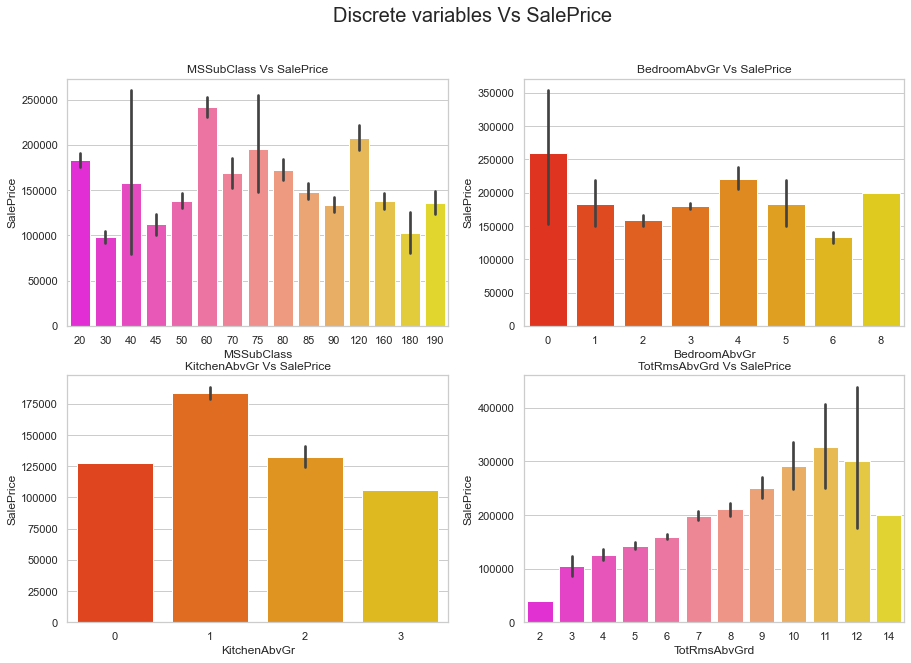

In [49]:
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('MSSubClass Vs SalePrice')
sns.barplot(x='MSSubClass',y='SalePrice',data=df_train,palette="spring")

plt.subplot(2,2,2)
plt.title('BedroomAbvGr Vs SalePrice')
sns.barplot(x='BedroomAbvGr',y='SalePrice',data=df_train,palette='autumn')

plt.subplot(2,2,3)
plt.title('KitchenAbvGr Vs SalePrice')
sns.barplot(x='KitchenAbvGr',y='SalePrice',data=df_train,palette="autumn")

plt.subplot(2,2,4)
plt.title('TotRmsAbvGrd Vs SalePrice')
sns.barplot(x='TotRmsAbvGrd',y='SalePrice',data=df_train,palette='spring')
plt.show()

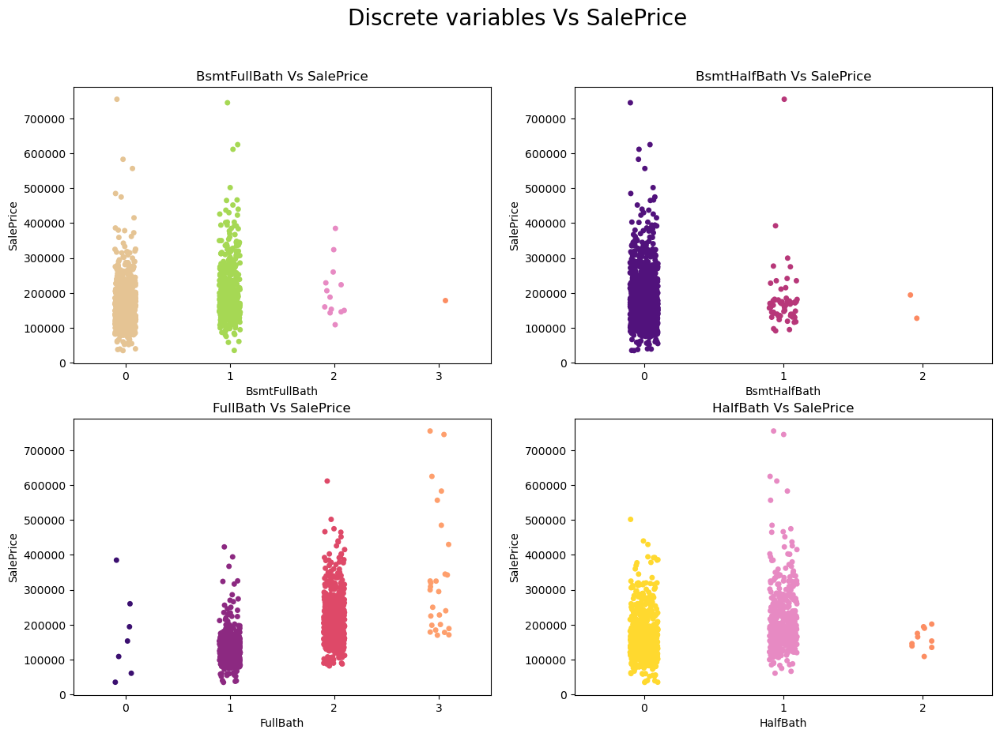

In [50]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('BsmtFullBath Vs SalePrice')
sns.stripplot(x='BsmtFullBath',y='SalePrice',data=df_train,palette="Set2_r")

plt.subplot(2,2,2)
plt.title('BsmtHalfBath Vs SalePrice')
sns.stripplot(x='BsmtHalfBath',y='SalePrice',data=df_train,palette='magma')

plt.subplot(2,2,3)
plt.title('FullBath Vs SalePrice')
sns.stripplot(x='FullBath',y='SalePrice',data=df_train,palette="magma")

plt.subplot(2,2,4)
plt.title('HalfBath Vs SalePrice')
sns.stripplot(x='HalfBath',y='SalePrice',data=df_train,palette='Set2_r')
plt.show()

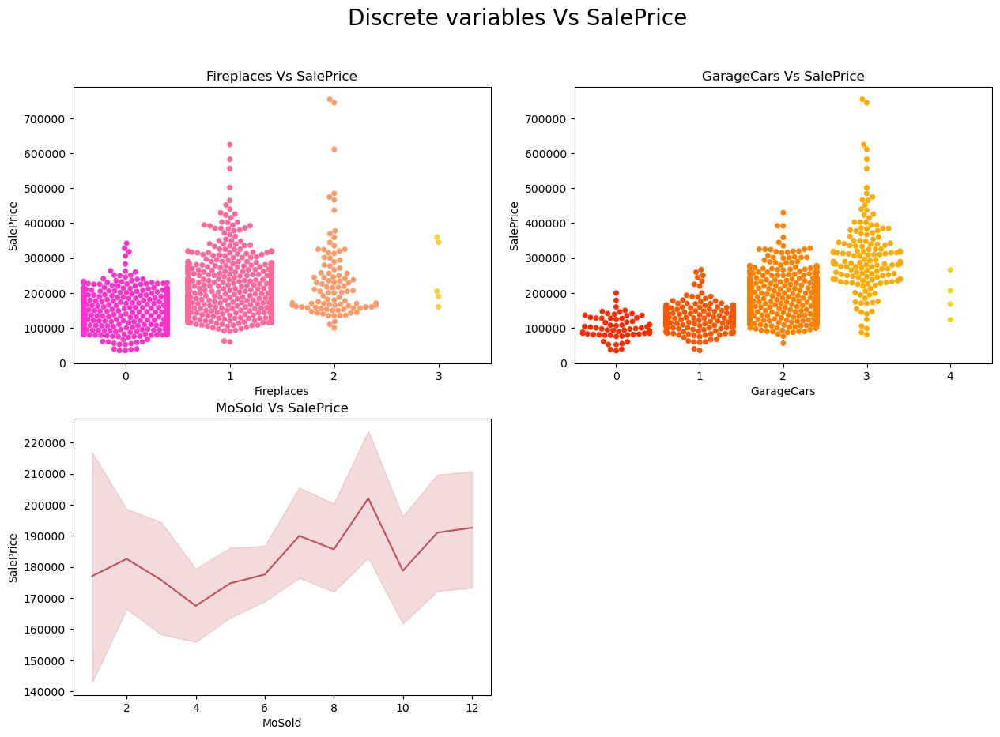

In [51]:
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('Fireplaces Vs SalePrice')
sns.swarmplot(x='Fireplaces',y='SalePrice',data=df_train,palette="spring")

plt.subplot(2,2,2)
plt.title('GarageCars Vs SalePrice')
sns.swarmplot(x='GarageCars',y='SalePrice',data=df_train,palette='autumn')

plt.subplot(2,2,3)
plt.title('MoSold Vs SalePrice')
sns.lineplot(x='MoSold',y='SalePrice',data=df_train,color='r')
plt.show()

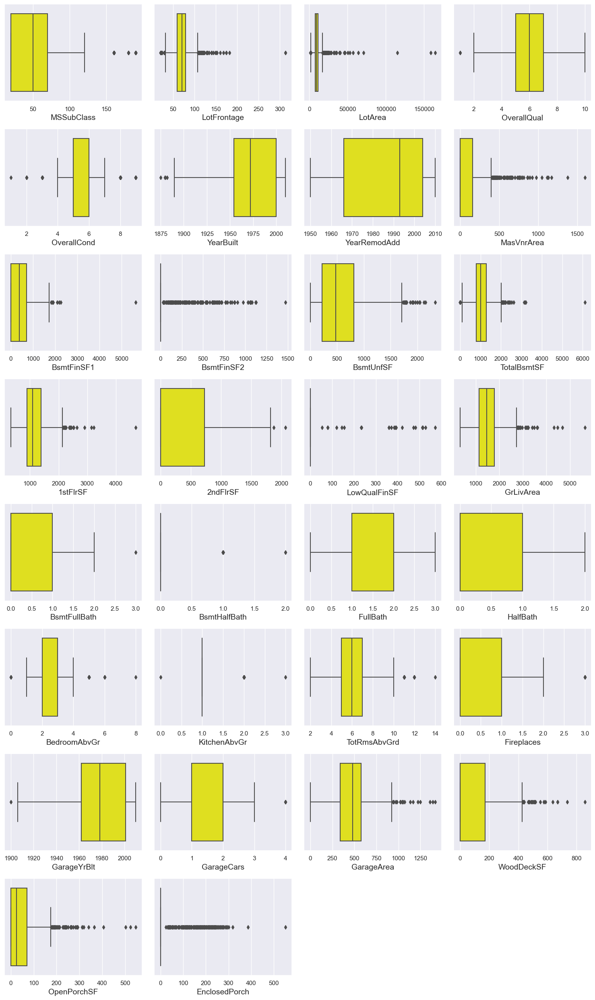

In [52]:
sns.set(style="darkgrid")

plt.figure(figsize=(15,25),facecolor='white')
plotnumber=1
for column in numerical_coltr:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(df_train[column],color="yellow")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

# Encoding Train DataFrame

In [53]:
column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in column:
    df_train[i] =  df_train[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [54]:
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in  df_train.columns:
    if  df_train[i].dtypes == "object":
         df_train[i] = enc.fit_transform( df_train[i].values.reshape(-1,1))

In [55]:
 df_train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,3.0,70.98847,4928,1.0,0.0,3.0,4.0,0.0,13.0,...,0,0,0,0,0,2,2007,8.0,4.0,128000
1,20,3.0,95.00000,15865,1.0,0.0,3.0,4.0,1.0,12.0,...,0,0,224,0,0,10,2007,8.0,4.0,268000
2,60,3.0,92.00000,9920,1.0,0.0,3.0,1.0,0.0,15.0,...,0,0,0,0,0,6,2007,8.0,4.0,269790
3,20,3.0,105.00000,11751,1.0,0.0,3.0,4.0,0.0,14.0,...,0,0,0,0,0,1,2010,0.0,4.0,190000
4,20,3.0,70.98847,16635,1.0,0.0,3.0,2.0,0.0,14.0,...,0,0,0,0,0,6,2009,8.0,4.0,215000


In [56]:
columns = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in columns:
    df_test[i] = df_test[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [57]:
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in df_test.columns:
    if df_test[i].dtypes == "object":
        df_test[i] = enc.fit_transform(df_test[i].values.reshape(-1,1))

In [58]:
df_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,2.0,86.000000,14157,1.0,0.0,1.0,0.0,0.0,21.0,...,51,0,0,0,0,0,7,2007,5.0,2.0
1,120,2.0,66.425101,5814,1.0,0.0,3.0,1.0,0.0,21.0,...,0,0,0,0,0,0,8,2009,0.0,0.0
2,20,2.0,66.425101,11838,1.0,3.0,3.0,4.0,0.0,4.0,...,151,0,0,0,0,0,6,2009,5.0,2.0
3,70,2.0,75.000000,12000,1.0,3.0,0.0,4.0,0.0,5.0,...,0,0,0,0,0,0,7,2009,5.0,2.0
4,60,2.0,86.000000,14598,1.0,0.0,3.0,1.0,0.0,20.0,...,18,0,0,0,0,0,1,2008,5.0,2.0


In [59]:
cor = df_test.corr()
cor

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
MSSubClass,1.000000,0.266517,-0.454786,-0.186654,0.004588,0.176681,0.068736,0.071784,-0.073979,-0.081962,...,-0.097449,-0.047570,-0.045672,-0.072139,NaN,0.137542,-0.004079,0.044441,-0.105307,-0.010155
MSZoning,0.266517,1.000000,-0.335754,-0.117968,-0.063162,0.167716,-0.099137,0.055261,-0.035312,-0.204984,...,-0.139292,0.183748,-0.023665,-0.059479,NaN,0.090554,0.074308,-0.072716,0.123993,0.005290
LotFrontage,-0.454786,-0.335754,1.000000,0.370091,-0.056531,-0.147720,-0.086163,-0.124470,0.176406,0.184817,...,0.075946,-0.060176,0.111523,0.068553,NaN,0.031567,-0.045333,0.059745,0.034876,0.037168
LotArea,-0.186654,-0.117968,0.370091,1.000000,-0.069626,-0.110574,-0.131482,-0.042599,0.620079,0.137189,...,0.067269,-0.055667,0.007832,0.090367,NaN,-0.020398,-0.034709,0.041735,0.037096,0.030689
Street,0.004588,-0.063162,-0.056531,-0.069626,1.000000,-0.002444,0.153613,0.058229,-0.324146,-0.045972,...,-0.106646,0.028389,0.006847,-0.165571,NaN,0.010465,0.036965,-0.040272,-0.019125,-0.012345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MiscVal,0.137542,0.090554,0.031567,-0.020398,0.010465,0.017304,0.037718,0.029676,-0.028515,-0.032973,...,-0.029976,-0.020024,0.103201,-0.032592,NaN,1.000000,0.009583,0.140017,0.029021,0.018734
MoSold,-0.004079,0.074308,-0.045333,-0.034709,0.036965,0.033461,0.037564,0.019805,-0.100718,0.024886,...,0.081174,0.003169,0.062146,-0.012744,NaN,0.009583,1.000000,-0.149289,0.044305,0.087636
YrSold,0.044441,-0.072716,0.059745,0.041735,-0.040272,0.097144,0.064777,0.008814,0.013349,0.077842,...,-0.024945,-0.027079,0.036249,-0.014433,NaN,0.140017,-0.149289,1.000000,-0.097726,-0.083345
SaleType,-0.105307,0.123993,0.034876,0.037096,-0.019125,0.072375,0.056451,0.104593,0.052109,-0.113653,...,-0.015685,-0.065219,0.018988,-0.032347,NaN,0.029021,0.044305,-0.097726,1.000000,0.349621


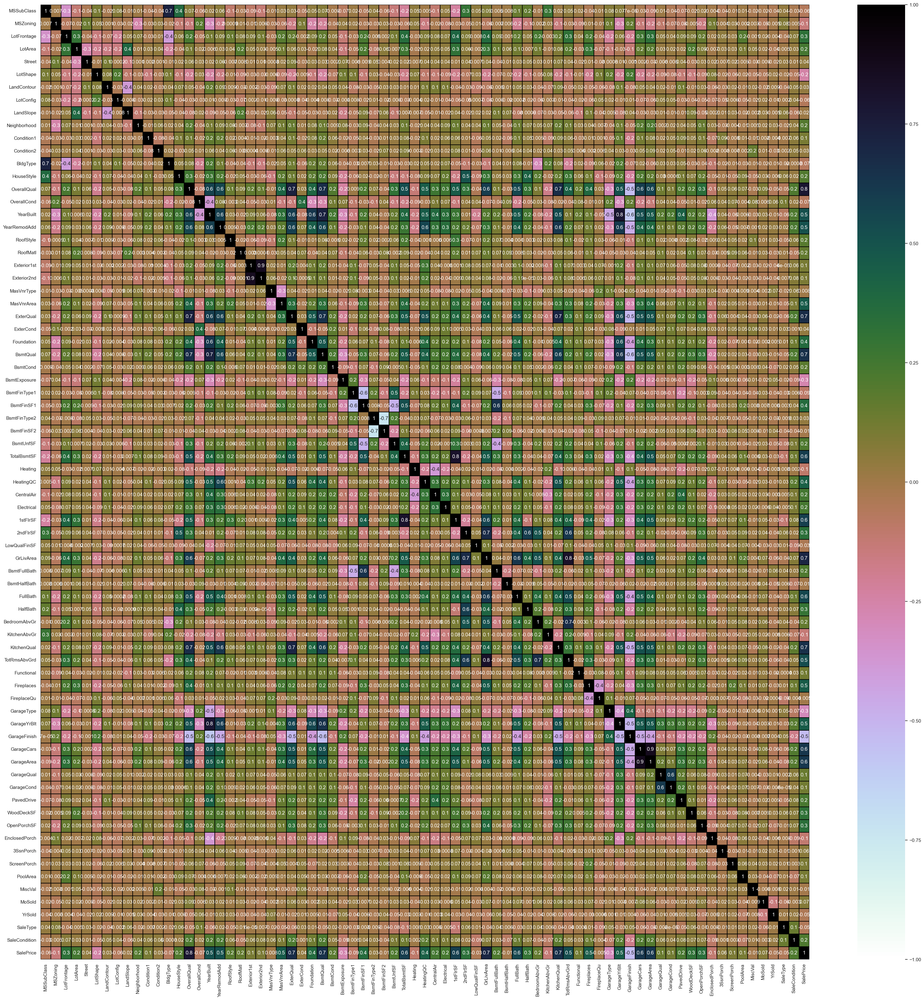

In [60]:
plt.figure(figsize=(40,40))    
sns.heatmap(df_train.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="cubehelix_r")
plt.yticks(rotation=0);

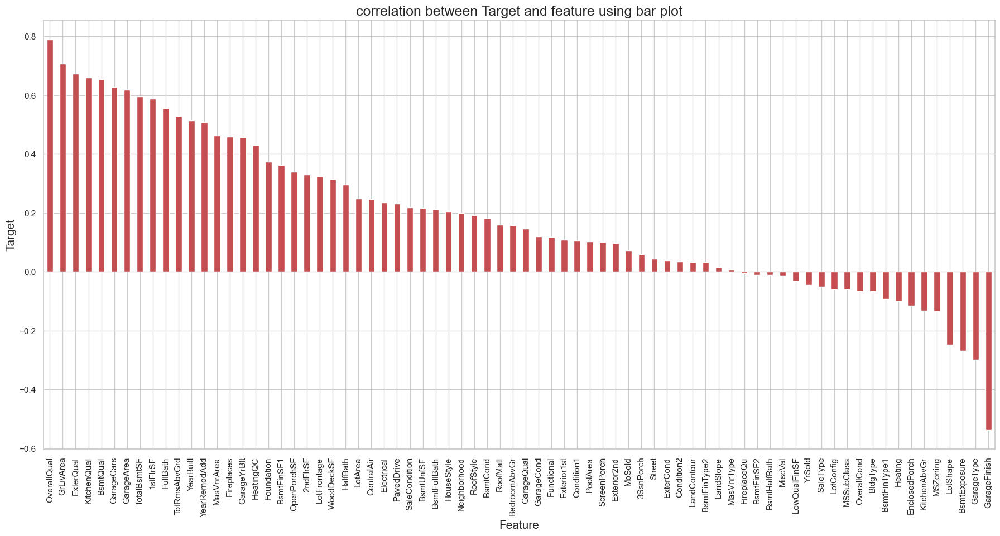

In [61]:
sns.set(style="whitegrid")

plt.figure(figsize=(22,10))
df_train.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='r')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('correlation between Target and feature using bar plot',fontsize=18)
plt.show()


In [62]:
cor1 = df_test.corr()
cor1

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
MSSubClass,1.000000,0.266517,-0.454786,-0.186654,0.004588,0.176681,0.068736,0.071784,-0.073979,-0.081962,...,-0.097449,-0.047570,-0.045672,-0.072139,NaN,0.137542,-0.004079,0.044441,-0.105307,-0.010155
MSZoning,0.266517,1.000000,-0.335754,-0.117968,-0.063162,0.167716,-0.099137,0.055261,-0.035312,-0.204984,...,-0.139292,0.183748,-0.023665,-0.059479,NaN,0.090554,0.074308,-0.072716,0.123993,0.005290
LotFrontage,-0.454786,-0.335754,1.000000,0.370091,-0.056531,-0.147720,-0.086163,-0.124470,0.176406,0.184817,...,0.075946,-0.060176,0.111523,0.068553,NaN,0.031567,-0.045333,0.059745,0.034876,0.037168
LotArea,-0.186654,-0.117968,0.370091,1.000000,-0.069626,-0.110574,-0.131482,-0.042599,0.620079,0.137189,...,0.067269,-0.055667,0.007832,0.090367,NaN,-0.020398,-0.034709,0.041735,0.037096,0.030689
Street,0.004588,-0.063162,-0.056531,-0.069626,1.000000,-0.002444,0.153613,0.058229,-0.324146,-0.045972,...,-0.106646,0.028389,0.006847,-0.165571,NaN,0.010465,0.036965,-0.040272,-0.019125,-0.012345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MiscVal,0.137542,0.090554,0.031567,-0.020398,0.010465,0.017304,0.037718,0.029676,-0.028515,-0.032973,...,-0.029976,-0.020024,0.103201,-0.032592,NaN,1.000000,0.009583,0.140017,0.029021,0.018734
MoSold,-0.004079,0.074308,-0.045333,-0.034709,0.036965,0.033461,0.037564,0.019805,-0.100718,0.024886,...,0.081174,0.003169,0.062146,-0.012744,NaN,0.009583,1.000000,-0.149289,0.044305,0.087636
YrSold,0.044441,-0.072716,0.059745,0.041735,-0.040272,0.097144,0.064777,0.008814,0.013349,0.077842,...,-0.024945,-0.027079,0.036249,-0.014433,NaN,0.140017,-0.149289,1.000000,-0.097726,-0.083345
SaleType,-0.105307,0.123993,0.034876,0.037096,-0.019125,0.072375,0.056451,0.104593,0.052109,-0.113653,...,-0.015685,-0.065219,0.018988,-0.032347,NaN,0.029021,0.044305,-0.097726,1.000000,0.349621


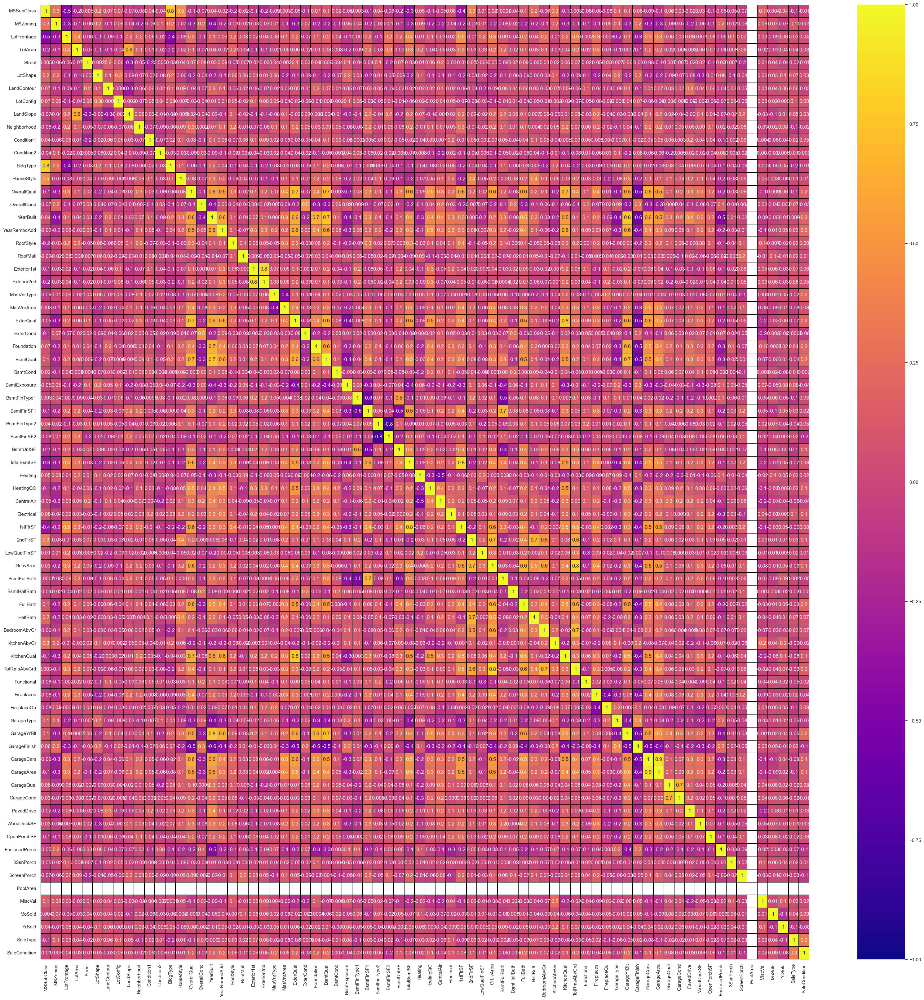

In [63]:
plt.figure(figsize=(40,40))    
sns.heatmap(df_test.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="plasma")
plt.yticks(rotation=0);

In [64]:
x = df_train.drop("SalePrice", axis=1)
y = df_train["SalePrice"]

In [65]:
x.shape, y.shape

((1168, 74), (1168,))

In [66]:
from sklearn.preprocessing import StandardScaler
# Scaling data
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1.508301,-0.021646,0.000000,-0.620616,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,...,2.387850,-0.364375,-0.125172,-0.273377,-0.076845,-0.087131,-1.617822,-0.605487,0.330033,0.207932
1,-0.877042,-0.021646,1.070631,0.600903,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,...,2.417992,-0.364375,-0.125172,3.795117,-0.076845,-0.087131,1.361470,-0.605487,0.330033,0.207932
2,0.077095,-0.021646,0.936867,-0.063075,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,...,1.257525,-0.364375,-0.125172,-0.273377,-0.076845,-0.087131,-0.128176,-0.605487,0.330033,0.207932
3,-0.877042,-0.021646,1.516514,0.141424,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,...,1.136957,-0.364375,-0.125172,-0.273377,-0.076845,-0.087131,-1.990233,1.651563,-4.612004,0.207932
4,-0.877042,-0.021646,0.000000,0.686902,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,...,-0.701705,-0.364375,-0.125172,-0.273377,-0.076845,-0.087131,-0.128176,0.899213,0.330033,0.207932


In [67]:
scaler = StandardScaler()
df_test = pd.DataFrame(scaler.fit_transform(df_test), columns=df_test.columns)
df_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,-0.856054,-0.287006,0.981605,0.263894,0.083045,-1.402669,-2.566101,-2.001106,-0.226274,1.554460,...,0.059897,-0.341845,-0.082453,-0.258624,0.0,-0.126021,0.276960,-0.650908,0.23029,0.148654
1,1.431981,-0.287006,0.000000,-0.363030,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.554460,...,-0.715738,-0.341845,-0.082453,-0.258624,0.0,-0.126021,0.637997,0.863555,-6.49418,-3.323909
2,-0.856054,-0.287006,0.000000,0.089636,0.083045,0.745474,0.299297,0.598774,-0.226274,-1.281387,...,1.580750,-0.341845,-0.082453,-0.258624,0.0,-0.126021,-0.084077,0.863555,0.23029,0.148654
3,0.287963,-0.287006,0.429998,0.101809,0.083045,0.745474,-3.998799,0.598774,-0.226274,-1.114572,...,-0.715738,-0.341845,-0.082453,-0.258624,0.0,-0.126021,0.276960,0.863555,0.23029,0.148654
4,0.059160,-0.287006,0.981605,0.297033,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.387645,...,-0.441985,-0.341845,-0.082453,-0.258624,0.0,-0.126021,-1.889261,0.106324,0.23029,0.148654


In [68]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,5.016066,MSSubClass
1,1.346964,MSZoning
2,1.765396,LotFrontage
3,1.742760,LotArea
4,1.183863,Street
...,...,...
69,1.085507,MiscVal
70,1.088755,MoSold
71,1.091074,YrSold
72,1.128881,SaleType


In [69]:
x.drop("GrLivArea",axis=1,inplace=True)

In [70]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,5.016066,MSSubClass
1,1.346964,MSZoning
2,1.765396,LotFrontage
3,1.742760,LotArea
4,1.183863,Street
...,...,...
68,1.085507,MiscVal
69,1.088755,MoSold
70,1.091074,YrSold
71,1.128881,SaleType


In [71]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(df_test.values,i)
                     for i in range(len(df_test.columns))]
vif["Features"] = df_test.columns

vif

,VIF values,Features
0,11.748934,MSSubClass
1,1.881462,MSZoning
2,2.688628,LotFrontage
3,2.542852,LotArea
4,1.633526,Street
...,...,...
69,1.754638,MiscVal
70,1.347307,MoSold
71,1.310768,YrSold
72,1.600518,SaleType


In [72]:
df_test.drop("GrLivArea",axis=1,inplace=True)

In [73]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(df_test.values,i)
                     for i in range(len(df_test.columns))]
vif["Features"] = df_test.columns

vif

,VIF values,Features
0,11.748934,MSSubClass
1,1.881462,MSZoning
2,2.688628,LotFrontage
3,2.542852,LotArea
4,1.633526,Street
...,...,...
68,1.754638,MiscVal
69,1.347307,MoSold
70,1.310768,YrSold
71,1.600518,SaleType


# BUILDING ML MODELS FROM TRAIN DATASET
Finding the Best Random State and Accuracy

In [74]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [75]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.901238968929777  on Random_state  135


In [76]:
RFR = RandomForestRegressor()
RFR.fit(x_train, y_train)
importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(RFR.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances

,Importance
Features,
OverallQual,0.613
2ndFlrSF,0.047
1stFlrSF,0.029
GarageArea,0.029
TotalBsmtSF,0.026
...,...
BsmtHalfBath,0.000
LowQualFinSF,0.000
Foundation,0.000


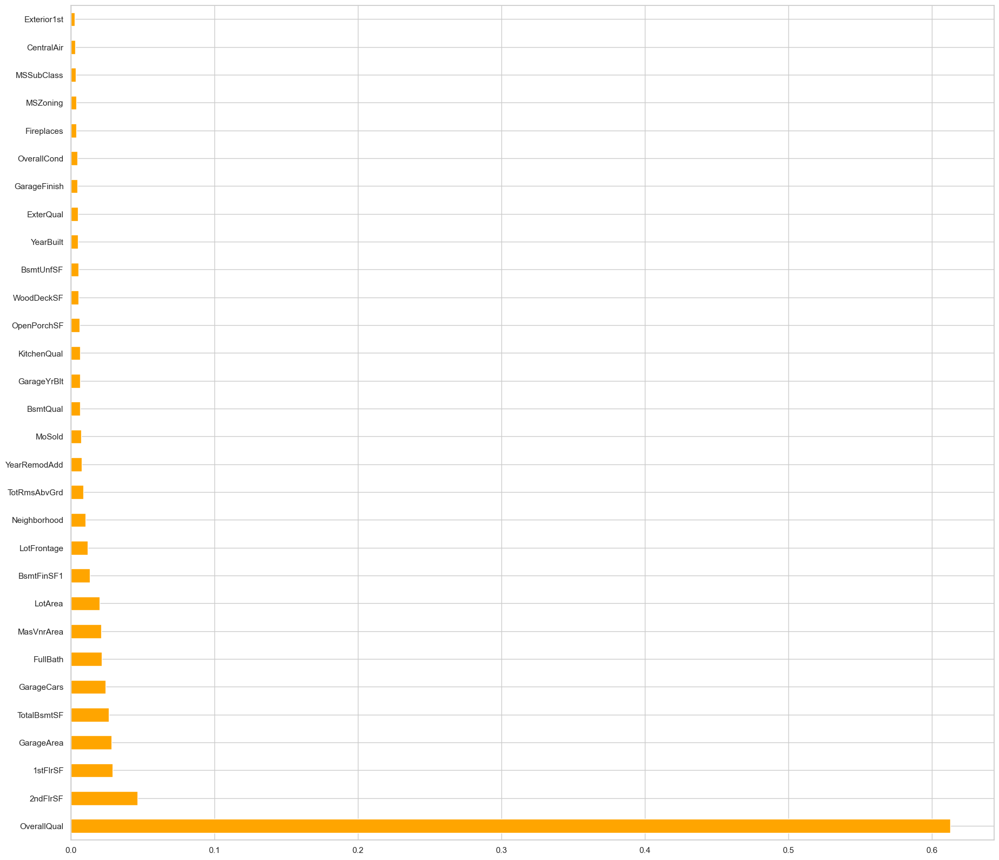

In [77]:
plt.figure(figsize=(22,20))
importances=pd.Series(RFR.feature_importances_,index=x.columns)
importances.nlargest(30).plot(kind='barh',color="Orange")
plt.show()

# Creating new train test split

In [78]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

# Regression Algorithms

In [87]:
! pip3 install xgboost
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, Lasso,Ridge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
import xgboost as xgb
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

# Linear Regression

R2_score: 0.8678117678241456
MAE: 20908.494735998305
MSE: 937256658.8381284
RMSE: 30614.64778236275
Cross Validation Score: 0.7360949173244


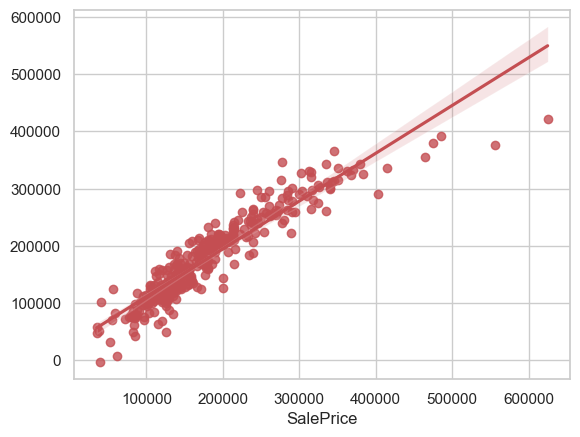

In [88]:
LR = LinearRegression()
LR.fit(x_train,y_train)

predLR=LR.predict(x_test)
lir=r2_score(y_test,predLR)
print('R2_score:',lir)


print('MAE:',metrics.mean_absolute_error(y_test, predLR))

print('MSE:',metrics.mean_squared_error(y_test, predLR))

print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predLR)))

lr_cv=cross_val_score(LR,x,y,cv=5).mean()
print("Cross Validation Score:",lr_cv)

sns.regplot(y_test,predLR,color="r")
plt.show()

# Regularization
Lasso Regressor

R2_Score: 0.8678406388262552
MAE: 20905.26040544059
MSE: 937051954.2397757
RMSE: 30611.30435378041
Cross Validation Score: 0.7359164076551717


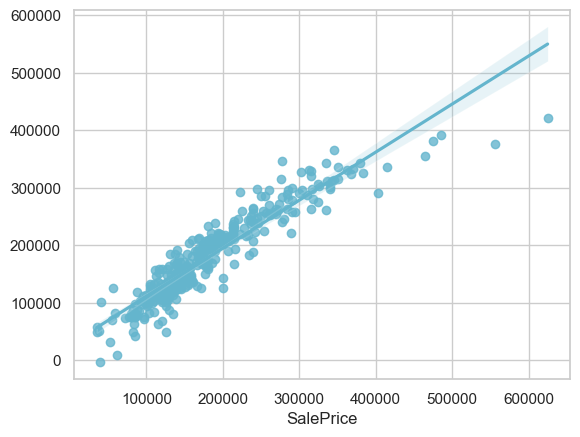

In [89]:
lasso=Lasso()

lasso.fit(x_train,y_train)
lasso.score(x_train,y_train)
pred_lasso=lasso.predict(x_test)
las=r2_score(y_test,pred_lasso)
print('R2_Score:',las)
print('MAE:',metrics.mean_absolute_error(y_test, pred_lasso))
print('MSE:',metrics.mean_squared_error(y_test, pred_lasso))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, pred_lasso)))

las_cv=cross_val_score(lasso,x,y,cv=5).mean()
print("Cross Validation Score:",las_cv)
dif2=las-las_cv
sns.regplot(y_test,pred_lasso,color="c")
plt.show()

# Ridge Regressor

R2_Score: 0.8686876553697526
MAE: 20117.892182126394
MSE: 931046337.2308207
RMSE: 30513.051916037843
Cross Validation Score: 0.7570686112947261


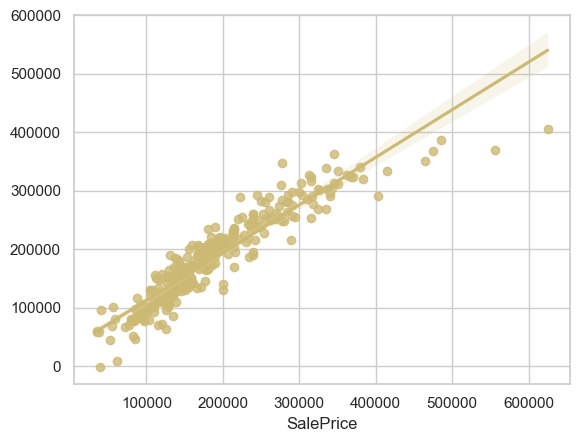

In [90]:
ridge=Ridge(alpha=100)
ridge.fit(x_train,y_train)
ridge.score(x_train,y_train)
pred_ridge=ridge.predict(x_test)
rid=r2_score(y_test,pred_ridge)
print('R2_Score:',rid)
print('MAE:',metrics.mean_absolute_error(y_test, pred_ridge))
print('MSE:',metrics.mean_squared_error(y_test, pred_ridge))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, pred_ridge)))

cross_val_score(ridge,x,y,cv=5).mean()
rid_cv=cross_val_score(ridge,x,y,cv=5).mean()
print("Cross Validation Score:",rid_cv)
dif3=rid-rid_cv

sns.regplot(y_test,pred_ridge,color="y")
plt.show()

# Ensemble Techniques
Random Forest Regressor

R2_Score: 0.8997396461114873
MAE: 17918.410655270654
MSE: 710877834.9835625
RMSE: 26662.292380505514
Cross Validation Score: 0.8406733558499828


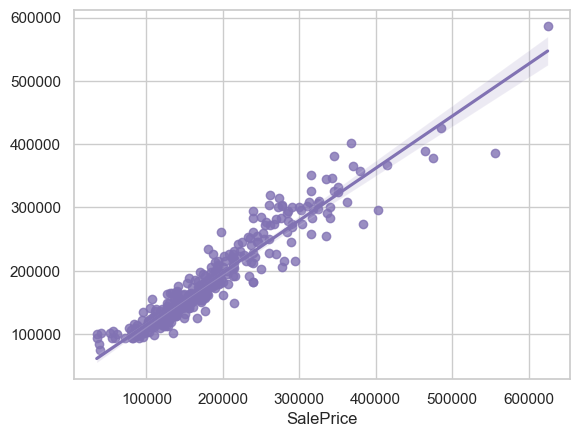

In [91]:
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)

predRFR=RFR.predict(x_test)
rfr=r2_score(y_test,predRFR)
print('R2_Score:',rfr)

print('MAE:',metrics.mean_absolute_error(y_test, predRFR))
print('MSE:',metrics.mean_squared_error(y_test, predRFR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predRFR)))

rfr_cv=cross_val_score(RFR,x,y,cv=5).mean()
print("Cross Validation Score:",rfr_cv)
dif4=rfr-rfr_cv

sns.regplot(y_test,predRFR,color="m")
plt.show()

# ExtraTrees Regressor

R2_Score: 0.9064770779630313
MAE: 18009.375698005697
MSE: 663107297.7550504
RMSE: 25750.869844629528
Cross Validation Score: 0.8385548055815087


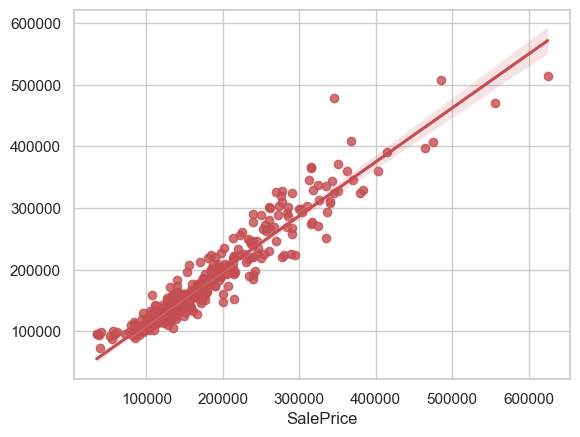

In [92]:
XT=ExtraTreesRegressor()
XT.fit(x_train,y_train)

predXT=XT.predict(x_test)
etr=r2_score(y_test,predXT)
print('R2_Score:',etr)

print('MAE:',metrics.mean_absolute_error(y_test, predXT))
print('MSE:',metrics.mean_squared_error(y_test, predXT))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predXT)))

etr_cv=cross_val_score(XT,x,y,cv=5).mean()
print("Cross Validation Score:",etr_cv)
dif5=etr-etr_cv

sns.regplot(y_test,predXT,color="r")
plt.show()

# GradientBoosting Regressor

R2_Score: 0.9240175551760572
MAE: 16118.684201158472
MSE: 538739728.8988726
RMSE: 23210.7675206761
Cross Validation Score: 0.8581912678830743


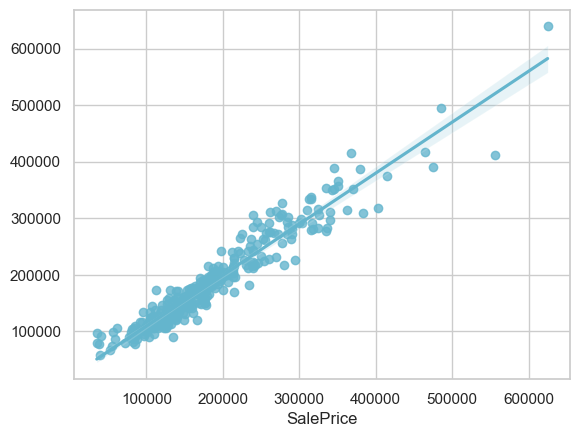

In [93]:
GB=GradientBoostingRegressor()
GB.fit(x_train,y_train)


predGB=GB.predict(x_test)
gbr=r2_score(y_test,predGB)
print('R2_Score:',gbr)

print('MAE:',metrics.mean_absolute_error(y_test, predGB))
print('MSE:',metrics.mean_squared_error(y_test, predGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predGB)))

gbr_cv=cross_val_score(GB,x,y,cv=5).mean()
print("Cross Validation Score:",gbr_cv)
dif6=gbr-gbr_cv

sns.regplot(y_test,predGB,color="c")
plt.show()

R2_Score: 0.9023087403437549
MAE: 17585.154814369656
MSE: 692662138.7998646
RMSE: 26318.475236986367
Cross Validation Score: 0.838942203374064


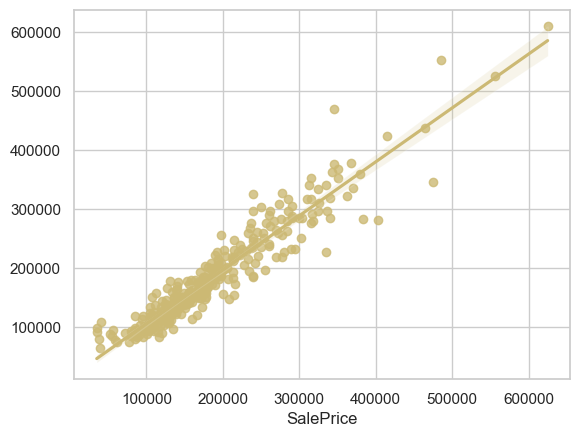

In [94]:
from xgboost import XGBRegressor as xgb

XGB=xgb(verbosity=0)
XGB.fit(x_train,y_train)

# prediction
predXGB=XGB.predict(x_test)
xgb=r2_score(y_test,predXGB)
print('R2_Score:',xgb)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predXGB))
print('MSE:',metrics.mean_squared_error(y_test, predXGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predXGB)))

# Checking cv score for XGB Regressor
xgb_cv=cross_val_score(XGB,x,y,cv=5).mean()
print("Cross Validation Score:",xgb_cv)
dif7=xgb-xgb_cv
# Visualizing the predicteed values
sns.regplot(y_test,predXGB,color="y")
plt.show()

R2_Score: 0.8817570909950895
MAE: 19538.515384615384
MSE: 838379876.9455556
RMSE: 28954.790224513035
Cross Validation Score: 0.819932407917706


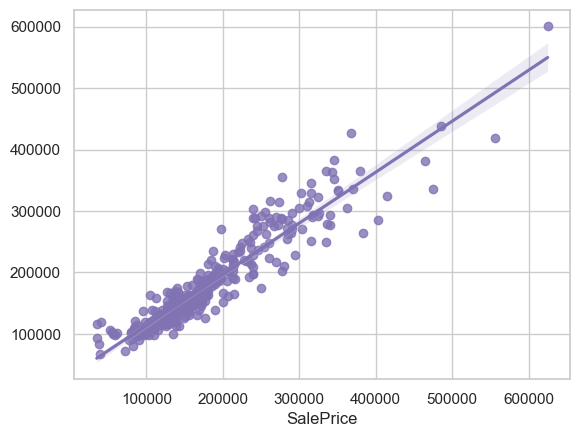

In [95]:
BR=BaggingRegressor()
BR.fit(x_train,y_train)


predBR=BR.predict(x_test)
br1=r2_score(y_test,predBR)
print('R2_Score:',br1)


print('MAE:',metrics.mean_absolute_error(y_test, predBR))
print('MSE:',metrics.mean_squared_error(y_test, predBR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predBR)))


br_cv=cross_val_score(BR,x,y,cv=5).mean()
print("Cross Validation Score:",br_cv)
dif8=br1-br_cv

sns.regplot(y_test,predBR,color="m")
plt.show()